Dataset citation: Kermany, Daniel; Zhang, Kang; Goldbaum, Michael (2018), “Labeled Optical Coherence Tomography (OCT) and Chest X-Ray Images for Classification”, Mendeley Data, V2, doi: 10.17632/rscbjbr9sj.2

http://www.cell.com/cell/fulltext/S0092-8674(18)30154-5

### [Package load]

In [1]:
import torch
print('pytorch version: {}'.format(torch.__version__))

pytorch version: 2.2.2


In [2]:
import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import glob
import os
import matplotlib.pyplot as plt
import numpy as np
from tqdm.notebook import tqdm
%matplotlib inline

print('pytorch version: {}'.format(torch.__version__))
print('GPU 사용 가능 여부: {}'.format(torch.cuda.is_available()))
device = "cuda" if torch.cuda.is_available() else "cpu"   # GPU 사용 가능 여부에 따라 device 정보 저장

pytorch version: 2.2.2
GPU 사용 가능 여부: False


In [3]:
# 이걸 해줘야 matplotlib 시행 시 에러가 안 남
import os
os.environ['KMP_DUPLICATE_LIB_OK']='True'

### [For Colab]

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

from pathlib import Path

folder = "인공지능 공부" # 상위 directory
project_dir = "[Kaggle] Retinal OCT Images (optical coherence tomography)제목없는 폴더" # 폴더 이름
base_path = Path("/content/drive/MyDrive/")
project_path = base_path / folder / project_dir

os.chdir(project_path)
for x in list(project_path.glob("*")):
    if x.is_dir():
        dir_name = str(x.relative_to(project_path))
        os.rename(dir_name, dir_name.split(" ", 1)[0])
print(f"현재 디렉토리 위치: {os.getcwd()}")

### [Setting Hyperparameters]

In [4]:
batch_size = 64
num_epochs = 30
learning_rate = 0.001

### [Dataset & DataLoader]

- ##### 3 channel: Input을 3번 concat -> (3,299,299) Inception에서는 크기가 299여야 함

In [5]:
data_dir = '../data/OCT'  # 압축 해제된 데이터셋의 디렉토리 경로

# For Kaggle notebook
#data_dir = '/kaggle/input/kermany2018/OCT2017 /'

In [6]:
class OCTDataset(Dataset):
    def __init__(self, data_dir, mode, transform=None):
        self.all_data = sorted(glob.glob(os.path.join(data_dir, mode,'*', '*')))
        self.transform = transform
    
    def __getitem__(self, index):
        data_path = self.all_data[index]
        img = Image.open(data_path)
        if self.transform is not None:
            img = self.transform(img)
        img = img.squeeze()
        img = torch.stack((img, img, img,), dim=0)  # InceptionV3가 3 channel이라 concat시키기
        name = os.path.basename(data_path)
        if name.startswith('NORMAL'):
            label = 0
        elif name.startswith('CNV'):
            label = 1
        elif name.startswith('DME'):
            label = 2
        elif name.startswith('DRUSEN'):
            label = 3
        return img, label
    
    def __len__(self):
        length = len(self.all_data)
        return length

In [7]:
data_transforms = {
    'train': transforms.Compose([
        transforms.RandomRotation(5),
        transforms.RandomResizedCrop(299, scale=(0.96, 1.0), ratio=(0.95, 1.05)),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.ToTensor(),
        transforms.Normalize(0.1881,0.1850)
    ]),
    'val': transforms.Compose([
        transforms.Resize([350]),
        transforms.CenterCrop(299),
        transforms.ToTensor(),
        transforms.Normalize(0.1881,0.1850)
    ])
}
# Inception v3는 (3,299,299)를 사용함

In [8]:
train_data = OCTDataset(data_dir=data_dir, mode='train', transform=data_transforms['train'])
val_data = OCTDataset(data_dir=data_dir, mode='val', transform=data_transforms['val'])
test_data = OCTDataset(data_dir=data_dir, mode='test', transform=data_transforms['val'])

In [9]:
train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True, drop_last=False)
val_loader = DataLoader(val_data, batch_size=batch_size, shuffle=False, drop_last=False)
test_loader = DataLoader(test_data, batch_size=batch_size, shuffle=False, drop_last=False)

In [10]:
train_mean = 0.1881
train_std = 0.1850

### [Model: Inception v3 Transfer Learning]

In [11]:
from collections import namedtuple
InceptionOutputs = namedtuple("InceptionOutputs", ["logits", "aux_logits"])

class TransferInceptionV3(nn.Module):
    def __init__ (self, num_classes, aux_logits=True):
        super(TransferInceptionV3, self).__init__()
        self.inception = torchvision.models.inception_v3(pretrained=True)
        aux_in_feature = self.inception.AuxLogits.fc.in_features
        self.inception.AuxLogits.fc = nn.Linear(aux_in_feature, num_classes)
        final_in_feature = self.inception.fc.in_features
        self.inception.fc = nn.Linear(final_in_feature, num_classes)
        
    def forward(self,x):
        return self.inception(x)

In [228]:
inception_transfer = TransferInceptionV3(num_classes=4).to(device)

In [229]:
temp = torch.Tensor(np.random.randint(1, 255, size=(2, 3, 299, 299)))
inception_transfer(temp)

InceptionOutputs(logits=tensor([[-0.2118,  0.2779, -0.3961, -0.2715],
        [ 0.0237,  0.3636, -0.2318,  0.3113]], grad_fn=<AddmmBackward0>), aux_logits=tensor([[ 0.0975,  0.3704, -0.5544, -0.5060],
        [-1.0842,  0.7955,  0.4740, -0.0754]], grad_fn=<AddmmBackward0>))

In [230]:
inception_transfer

TransferInceptionV3(
  (inception): Inception3(
    (Conv2d_1a_3x3): BasicConv2d(
      (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (Conv2d_2a_3x3): BasicConv2d(
      (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (Conv2d_2b_3x3): BasicConv2d(
      (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (Conv2d_3b_1x1): BasicConv2d(
      (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (Conv2d_4a

In [231]:
from torchsummary import summary
summary(inception_transfer, (3, 299, 299))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 149, 149]             864
       BatchNorm2d-2         [-1, 32, 149, 149]              64
       BasicConv2d-3         [-1, 32, 149, 149]               0
            Conv2d-4         [-1, 32, 147, 147]           9,216
       BatchNorm2d-5         [-1, 32, 147, 147]              64
       BasicConv2d-6         [-1, 32, 147, 147]               0
            Conv2d-7         [-1, 64, 147, 147]          18,432
       BatchNorm2d-8         [-1, 64, 147, 147]             128
       BasicConv2d-9         [-1, 64, 147, 147]               0
        MaxPool2d-10           [-1, 64, 73, 73]               0
           Conv2d-11           [-1, 80, 73, 73]           5,120
      BatchNorm2d-12           [-1, 80, 73, 73]             160
      BasicConv2d-13           [-1, 80, 73, 73]               0
           Conv2d-14          [-1, 192,

In [232]:
from torchinfo import summary
summary(inception_transfer, input_size=(2, 3, 299, 299), col_width=20, depth=1000, row_settings=["depth", "var_names"], col_names=["input_size", "kernel_size", "output_size", "params_percent"])

Layer (type (var_name):depth-idx)                       Input Shape          Kernel Shape         Output Shape         Param %
TransferInceptionV3 (TransferInceptionV3)               [2, 3, 299, 299]     --                   [2, 4]                    --
├─Inception3 (inception): 1-1                           [2, 3, 299, 299]     --                   [2, 4]                10.51%
│    └─BasicConv2d (Conv2d_1a_3x3): 2-1                 [2, 3, 299, 299]     --                   [2, 32, 149, 149]         --
│    │    └─Conv2d (conv): 3-1                          [2, 3, 299, 299]     [3, 3]               [2, 32, 149, 149]      0.00%
│    │    └─BatchNorm2d (bn): 3-2                       [2, 32, 149, 149]    --                   [2, 32, 149, 149]      0.00%
│    └─BasicConv2d (Conv2d_2a_3x3): 2-2                 [2, 32, 149, 149]    --                   [2, 32, 147, 147]         --
│    │    └─Conv2d (conv): 3-3                          [2, 32, 149, 149]    [3, 3]               [2, 32, 147, 

In [233]:
count = 0
for name, param in inception_transfer.inception.named_parameters():
    count += 1
    print(f"count:{count},",name, param.requires_grad)

count:1, Conv2d_1a_3x3.conv.weight True
count:2, Conv2d_1a_3x3.bn.weight True
count:3, Conv2d_1a_3x3.bn.bias True
count:4, Conv2d_2a_3x3.conv.weight True
count:5, Conv2d_2a_3x3.bn.weight True
count:6, Conv2d_2a_3x3.bn.bias True
count:7, Conv2d_2b_3x3.conv.weight True
count:8, Conv2d_2b_3x3.bn.weight True
count:9, Conv2d_2b_3x3.bn.bias True
count:10, Conv2d_3b_1x1.conv.weight True
count:11, Conv2d_3b_1x1.bn.weight True
count:12, Conv2d_3b_1x1.bn.bias True
count:13, Conv2d_4a_3x3.conv.weight True
count:14, Conv2d_4a_3x3.bn.weight True
count:15, Conv2d_4a_3x3.bn.bias True
count:16, Mixed_5b.branch1x1.conv.weight True
count:17, Mixed_5b.branch1x1.bn.weight True
count:18, Mixed_5b.branch1x1.bn.bias True
count:19, Mixed_5b.branch5x5_1.conv.weight True
count:20, Mixed_5b.branch5x5_1.bn.weight True
count:21, Mixed_5b.branch5x5_1.bn.bias True
count:22, Mixed_5b.branch5x5_2.conv.weight True
count:23, Mixed_5b.branch5x5_2.bn.weight True
count:24, Mixed_5b.branch5x5_2.bn.bias True
count:25, Mixed_

In [234]:
# Auxiliary logit + 이전 6e inception module (181 ~ 218) / Fc layer + 이전 7b, 7c inception module (237~292)
count = 0
for param in inception_transfer.inception.parameters():
    count += 1
    if (181 <= count and count <= 218):
        param.requires_grad = True
    elif (237 <= count and count <= 292):
        param.requires_grad = True
    else:
        param.requires_grad = False

for name, param in inception_transfer.inception.named_parameters():
    print(name, param.requires_grad)

Conv2d_1a_3x3.conv.weight False
Conv2d_1a_3x3.bn.weight False
Conv2d_1a_3x3.bn.bias False
Conv2d_2a_3x3.conv.weight False
Conv2d_2a_3x3.bn.weight False
Conv2d_2a_3x3.bn.bias False
Conv2d_2b_3x3.conv.weight False
Conv2d_2b_3x3.bn.weight False
Conv2d_2b_3x3.bn.bias False
Conv2d_3b_1x1.conv.weight False
Conv2d_3b_1x1.bn.weight False
Conv2d_3b_1x1.bn.bias False
Conv2d_4a_3x3.conv.weight False
Conv2d_4a_3x3.bn.weight False
Conv2d_4a_3x3.bn.bias False
Mixed_5b.branch1x1.conv.weight False
Mixed_5b.branch1x1.bn.weight False
Mixed_5b.branch1x1.bn.bias False
Mixed_5b.branch5x5_1.conv.weight False
Mixed_5b.branch5x5_1.bn.weight False
Mixed_5b.branch5x5_1.bn.bias False
Mixed_5b.branch5x5_2.conv.weight False
Mixed_5b.branch5x5_2.bn.weight False
Mixed_5b.branch5x5_2.bn.bias False
Mixed_5b.branch3x3dbl_1.conv.weight False
Mixed_5b.branch3x3dbl_1.bn.weight False
Mixed_5b.branch3x3dbl_1.bn.bias False
Mixed_5b.branch3x3dbl_2.conv.weight False
Mixed_5b.branch3x3dbl_2.bn.weight False
Mixed_5b.branch3x3dbl

In [235]:
# 7b inception module의 Conv layer를 다시 initialization
name_list=[]
for name, param in inception_transfer.inception.Mixed_7b.named_parameters():
    name_list = name.split('.')
    if name_list[1]=='conv':
        if name_list[2]=='weight':
            print(name)
            nn.init.xavier_uniform_(param)
            print(name+'의 conv filter initialization setting 완료')
            print()

# 7c inception module의 Conv layer를 다시 initialization
name_list=[]
for name, param in inception_transfer.inception.Mixed_7c.named_parameters():
    name_list = name.split('.')
    if name_list[1]=='conv':
        if name_list[2]=='weight':
            print(name)
            nn.init.xavier_uniform_(param)
            print(name+'의 conv filter initialization setting 완료')
            print()

branch1x1.conv.weight
branch1x1.conv.weight의 conv filter initialization setting 완료

branch3x3_1.conv.weight
branch3x3_1.conv.weight의 conv filter initialization setting 완료

branch3x3_2a.conv.weight
branch3x3_2a.conv.weight의 conv filter initialization setting 완료

branch3x3_2b.conv.weight
branch3x3_2b.conv.weight의 conv filter initialization setting 완료

branch3x3dbl_1.conv.weight
branch3x3dbl_1.conv.weight의 conv filter initialization setting 완료

branch3x3dbl_2.conv.weight
branch3x3dbl_2.conv.weight의 conv filter initialization setting 완료

branch3x3dbl_3a.conv.weight
branch3x3dbl_3a.conv.weight의 conv filter initialization setting 완료

branch3x3dbl_3b.conv.weight
branch3x3dbl_3b.conv.weight의 conv filter initialization setting 완료

branch_pool.conv.weight
branch_pool.conv.weight의 conv filter initialization setting 완료

branch1x1.conv.weight
branch1x1.conv.weight의 conv filter initialization setting 완료

branch3x3_1.conv.weight
branch3x3_1.conv.weight의 conv filter initialization setting 완료

branch3x

In [236]:
# 7b, 7c inception module의 batch normalization gamma, beta initialization
# Residual block이 없으니 모두 1로 initialization, beta는 0으로 initialization
name_list=[]
for name, param in inception_transfer.inception.Mixed_7b.named_parameters():
    name_list = name.split('.')
    if name_list[1]=='bn':
        if name_list[2]=='weight':
            print(name)
            nn.init.ones_(param)
            print(name+'의 gamma one setting 완료')
            print()
        elif name_list[2]=='bias':
            print(name)
            nn.init.zeros_(param)
            print(name+'의 beta zero setting 완료')
            print()

name_list=[]
for name, param in inception_transfer.inception.Mixed_7c.named_parameters():
    name_list = name.split('.')
    if name_list[1]=='bn':
        if name_list[2]=='weight':
            print(name)
            nn.init.ones_(param)
            print(name+'의 gamma one setting 완료')
            print()
        elif name_list[2]=='bias':
            print(name)
            nn.init.zeros_(param)
            print(name+'의 beta zero setting 완료')
            print()

branch1x1.bn.weight
branch1x1.bn.weight의 gamma one setting 완료

branch1x1.bn.bias
branch1x1.bn.bias의 beta zero setting 완료

branch3x3_1.bn.weight
branch3x3_1.bn.weight의 gamma one setting 완료

branch3x3_1.bn.bias
branch3x3_1.bn.bias의 beta zero setting 완료

branch3x3_2a.bn.weight
branch3x3_2a.bn.weight의 gamma one setting 완료

branch3x3_2a.bn.bias
branch3x3_2a.bn.bias의 beta zero setting 완료

branch3x3_2b.bn.weight
branch3x3_2b.bn.weight의 gamma one setting 완료

branch3x3_2b.bn.bias
branch3x3_2b.bn.bias의 beta zero setting 완료

branch3x3dbl_1.bn.weight
branch3x3dbl_1.bn.weight의 gamma one setting 완료

branch3x3dbl_1.bn.bias
branch3x3dbl_1.bn.bias의 beta zero setting 완료

branch3x3dbl_2.bn.weight
branch3x3dbl_2.bn.weight의 gamma one setting 완료

branch3x3dbl_2.bn.bias
branch3x3dbl_2.bn.bias의 beta zero setting 완료

branch3x3dbl_3a.bn.weight
branch3x3dbl_3a.bn.weight의 gamma one setting 완료

branch3x3dbl_3a.bn.bias
branch3x3dbl_3a.bn.bias의 beta zero setting 완료

branch3x3dbl_3b.bn.weight
branch3x3dbl_3b.bn.weigh

### [Saving checkpoints]

In [237]:
def save_model(model, epoch, optimizer, epoch_loss, val_accuracy, saved_dir):
    os.makedirs(saved_dir, exist_ok=True)
    check_point = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'loss': epoch_loss
    }
    val_accuracy = round(val_accuracy,1)
    file_name = str(f"ckpoint_{epoch+1}_{val_accuracy}%.pt")
    output_path = os.path.join(saved_dir, file_name)
    torch.save(check_point,output_path)

### [Loss tracker]

##### Visdom for local setting

In [ ]:
import visdom

vis = visdom.Visdom()
vis.close(env="main")

In [ ]:
def loss_tracker(loss_plot, loss_value, num):
    '''num, loss_value, are Tensor'''
    vis.line(X=num,
             Y=loss_value,
             win = loss_plot,
             update='append'
             )

In [ ]:
loss_plt = vis.line(Y=torch.Tensor(1).zero_(),opts=dict(title='loss_tracker', legend=['loss'], showlegend=True))

##### Tensorboard

In [238]:
logs_base_dir = "./logs/logs_transfer"
os.makedirs(logs_base_dir, exist_ok=True)

from torch.utils.tensorboard import SummaryWriter
writer = SummaryWriter(logs_base_dir)

### [Defining Train, Val, Test Function]

In [239]:
def train(num_epochs, model, data_loader, criterion, optimizer, scheduler, val_every, device, saved_dir, writer):
    print('Start training..')
    torch.cuda.empty_cache()
    best_loss = 9999999
    train_loss_list = []
    val_loss_list = []
    train_accuracy_list = []
    val_accuracy_list = []
    best_epoch = 0
    count = 0
    for epoch in tqdm(range(num_epochs), desc='epoch'):
        # running_loss = 0.0
        for i, (imgs, labels) in tqdm(enumerate(data_loader), desc="in epoch"):
            imgs, labels = imgs.to(device), labels.to(device)
            outputs, aux = model(imgs)       # 여기서 inception net의 특징이 나옴
            output_loss = criterion(outputs, labels)
            aux_loss = criterion(aux, labels)
            loss = output_loss + 0.3*aux_loss

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            # Saving train loss
            train_loss_list.append(loss.item())

            _, argmax = torch.max(outputs, 1)
            accuracy = (labels == argmax).float().mean()
            # Saving train accuracy
            train_accuracy_list.append(accuracy)

            if (i+1) % 30 == 0:
                print('Epoch [{}/{}], Step [{}/{}], Loss: {:.4f}, Accuracy: {:.2f}%'.format(
                    epoch+1, num_epochs, i+1, len(data_loader), loss.item(), accuracy.item() * 100))
            if (i+1) % 50 == 0:
                writer.add_scalar('Loss/Train', loss, i)
                writer.add_scalar('Accuracy/Train', accuracy, i)
            #if i % 30 == 29:
                #loss_tracker(loss_plt, torch.Tensor([running_loss/30]), torch.Tensor([i + epoch*len(trainloader) ]))
                #running_loss = 0.0
        if (epoch + 1) % val_every == 0:
            avrg_loss, val_accuracy = validation(epoch + 1, model, val_loader, criterion, device)
            # Saving validation loss and accuracy
            val_loss_list.append(avrg_loss)
            writer.add_scalar('Loss/Validation', avrg_loss, epoch+1)
            val_accuracy_list.append(val_accuracy)
            writer.add_scalar('Accuracy/Validation', val_accuracy, epoch+1)
            if avrg_loss < best_loss:
                print('Best performance at epoch: {}'.format(epoch + 1))
                print('Save model in', saved_dir)
                best_loss = avrg_loss
                save_model(model, epoch, optimizer, avrg_loss, val_accuracy, saved_dir)
                count = 0
                best_epoch = epoch + 1
            else:
                count += 1
                print(f'Best epoch does not appear / Previous best epoch:{best_epoch}')
                print(f'A number of epochs remain until early stop: {10-count}')
                if count >= 10:
                    print('Best performance does not occur within 10 epochs. Early stopping!!')
                    scheduler.step()
                    writer.flush()
                    return train_loss_list, val_loss_list, train_accuracy_list, val_accuracy_list
            ''' Only for local setting
            loss_tracker(loss_plt, torch.Tensor([avrg_loss]), torch.Tensor([epoch]))'''
    scheduler.step()
    writer.flush()
    return train_loss_list, val_loss_list, train_accuracy_list, val_accuracy_list

In [240]:
def validation(epoch, model, data_loader, criterion, device):
    print('Start validation #{}'.format(epoch) )
    model.eval()
    with torch.no_grad():
        total = 0
        correct = 0
        total_loss = 0
        cnt = 0
        for i, (imgs, labels) in enumerate(data_loader):
            imgs, labels = imgs.to(device), labels.to(device)
            
            outputs = model(imgs)       # eval을 했기 때문에 aux가 필요 없음
            loss = criterion(outputs, labels)
            
            total += imgs.size(0)
            _, argmax = torch.max(outputs, 1)
            correct += (labels == argmax).sum().item()
            total_loss += loss
            cnt += 1
        avrg_loss = total_loss / cnt
        val_accuracy = correct / total * 100
        print('Validation #{}  Accuracy: {:.2f}%  Average Loss: {:.4f}'.format(epoch, val_accuracy, avrg_loss))
    model.train()
    return avrg_loss, val_accuracy

In [14]:
def test(model, data_loader, device):
    print('Start test..')
    model.eval()
    with torch.no_grad():
        correct = 0
        total = 0
        answer_list = []
        pred_list = []
        pred_proba_list = []
        
        for i, (imgs, labels) in tqdm(enumerate(data_loader)):
            imgs, labels = imgs.to(device), labels.to(device)
            outputs = model(imgs)       # 여기도 eval을 하기 때문에 aux가 필요 없음

            pred_probability = F.softmax(outputs, dim=1)
            pred_proba_list.append(pred_probability.tolist())
            
            _, argmax = torch.max(outputs, 1)
            pred_list.append(argmax.tolist())

            total += imgs.size(0)
            correct += (labels == argmax).sum().item()
            
            answer_list.append(labels.tolist())
        
        print('Test accuracy for {} images: {:.2f}%'.format(total, correct / total * 100))
    model.train()        
    return pred_list, answer_list, pred_proba_list

### [Loss function, Optimizer, Directory for saving]

In [242]:
torch.manual_seed(7777)

criterion = nn.CrossEntropyLoss().to(device)
optimizer = torch.optim.Adam(inception_transfer.parameters(), lr=learning_rate)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=10, eta_min=0.00001)

val_every = 1
saved_dir = './saved'

### [Train]

In [ ]:
train_loss_list, val_loss_list, train_accuracy_list, val_accuracy_list = train(num_epochs, inception_transfer, train_loader, criterion, optimizer, scheduler, val_every, device, saved_dir, writer)

Start training..


epoch:   0%|          | 0/50 [00:00<?, ?it/s]

in epoch: 0it [00:00, ?it/s]

Epoch [1/50], Step [30/1305], Loss: 0.3552, Accuracy: 90.62%
Epoch [1/50], Step [60/1305], Loss: 0.2752, Accuracy: 95.31%
Epoch [1/50], Step [90/1305], Loss: 0.5236, Accuracy: 85.94%
Epoch [1/50], Step [120/1305], Loss: 0.3976, Accuracy: 89.06%
Epoch [1/50], Step [150/1305], Loss: 0.5068, Accuracy: 90.62%
Epoch [1/50], Step [180/1305], Loss: 0.3227, Accuracy: 89.06%
Epoch [1/50], Step [210/1305], Loss: 0.3037, Accuracy: 89.06%
Epoch [1/50], Step [240/1305], Loss: 0.2001, Accuracy: 95.31%
Epoch [1/50], Step [270/1305], Loss: 0.2407, Accuracy: 96.88%
Epoch [1/50], Step [300/1305], Loss: 0.2449, Accuracy: 96.88%
Epoch [1/50], Step [330/1305], Loss: 0.3068, Accuracy: 93.75%
Epoch [1/50], Step [360/1305], Loss: 0.2016, Accuracy: 93.75%
Epoch [1/50], Step [390/1305], Loss: 0.1526, Accuracy: 96.88%
Epoch [1/50], Step [420/1305], Loss: 0.0705, Accuracy: 98.44%
Epoch [1/50], Step [450/1305], Loss: 0.2164, Accuracy: 95.31%
Epoch [1/50], Step [480/1305], Loss: 0.2903, Accuracy: 96.88%
Epoch [1/50

in epoch: 0it [00:00, ?it/s]

Epoch [2/50], Step [30/1305], Loss: 0.2822, Accuracy: 93.75%
Epoch [2/50], Step [60/1305], Loss: 0.3116, Accuracy: 90.62%
Epoch [2/50], Step [90/1305], Loss: 0.1667, Accuracy: 92.19%
Epoch [2/50], Step [120/1305], Loss: 0.1021, Accuracy: 98.44%
Epoch [2/50], Step [150/1305], Loss: 0.1758, Accuracy: 95.31%
Epoch [2/50], Step [180/1305], Loss: 0.1338, Accuracy: 95.31%
Epoch [2/50], Step [210/1305], Loss: 0.1738, Accuracy: 95.31%
Epoch [2/50], Step [240/1305], Loss: 0.0606, Accuracy: 100.00%
Epoch [2/50], Step [270/1305], Loss: 0.0556, Accuracy: 100.00%
Epoch [2/50], Step [300/1305], Loss: 0.0600, Accuracy: 98.44%
Epoch [2/50], Step [330/1305], Loss: 0.2251, Accuracy: 95.31%
Epoch [2/50], Step [360/1305], Loss: 0.1158, Accuracy: 96.88%
Epoch [2/50], Step [390/1305], Loss: 0.1403, Accuracy: 95.31%
Epoch [2/50], Step [420/1305], Loss: 0.1093, Accuracy: 96.88%
Epoch [2/50], Step [450/1305], Loss: 0.1257, Accuracy: 96.88%
Epoch [2/50], Step [480/1305], Loss: 0.1393, Accuracy: 96.88%
Epoch [2/

in epoch: 0it [00:00, ?it/s]

Epoch [3/50], Step [30/1305], Loss: 0.1148, Accuracy: 96.88%
Epoch [3/50], Step [60/1305], Loss: 0.0606, Accuracy: 98.44%
Epoch [3/50], Step [90/1305], Loss: 0.1863, Accuracy: 96.88%
Epoch [3/50], Step [120/1305], Loss: 0.1841, Accuracy: 95.31%
Epoch [3/50], Step [150/1305], Loss: 0.1551, Accuracy: 93.75%
Epoch [3/50], Step [180/1305], Loss: 0.1150, Accuracy: 95.31%
Epoch [3/50], Step [210/1305], Loss: 0.0571, Accuracy: 98.44%
Epoch [3/50], Step [240/1305], Loss: 0.0847, Accuracy: 96.88%
Epoch [3/50], Step [270/1305], Loss: 0.1351, Accuracy: 98.44%
Epoch [3/50], Step [300/1305], Loss: 0.1719, Accuracy: 93.75%
Epoch [3/50], Step [330/1305], Loss: 0.0385, Accuracy: 100.00%
Epoch [3/50], Step [360/1305], Loss: 0.1183, Accuracy: 95.31%
Epoch [3/50], Step [390/1305], Loss: 0.2617, Accuracy: 92.19%
Epoch [3/50], Step [420/1305], Loss: 0.0352, Accuracy: 100.00%
Epoch [3/50], Step [450/1305], Loss: 0.2353, Accuracy: 93.75%
Epoch [3/50], Step [480/1305], Loss: 0.0663, Accuracy: 98.44%
Epoch [3/

in epoch: 0it [00:00, ?it/s]

Epoch [4/50], Step [30/1305], Loss: 0.2148, Accuracy: 93.75%
Epoch [4/50], Step [60/1305], Loss: 0.0280, Accuracy: 100.00%
Epoch [4/50], Step [90/1305], Loss: 0.1149, Accuracy: 95.31%
Epoch [4/50], Step [120/1305], Loss: 0.0970, Accuracy: 95.31%
Epoch [4/50], Step [150/1305], Loss: 0.2315, Accuracy: 90.62%
Epoch [4/50], Step [180/1305], Loss: 0.2596, Accuracy: 90.62%
Epoch [4/50], Step [210/1305], Loss: 0.0983, Accuracy: 96.88%
Epoch [4/50], Step [240/1305], Loss: 0.2129, Accuracy: 95.31%
Epoch [4/50], Step [270/1305], Loss: 0.1791, Accuracy: 95.31%
Epoch [4/50], Step [300/1305], Loss: 0.2768, Accuracy: 95.31%
Epoch [4/50], Step [330/1305], Loss: 0.1372, Accuracy: 95.31%
Epoch [4/50], Step [360/1305], Loss: 0.0761, Accuracy: 98.44%
Epoch [4/50], Step [390/1305], Loss: 0.0862, Accuracy: 96.88%
Epoch [4/50], Step [420/1305], Loss: 0.0523, Accuracy: 98.44%
Epoch [4/50], Step [450/1305], Loss: 0.0620, Accuracy: 100.00%
Epoch [4/50], Step [480/1305], Loss: 0.0691, Accuracy: 98.44%
Epoch [4/

in epoch: 0it [00:00, ?it/s]

Epoch [5/50], Step [30/1305], Loss: 0.1703, Accuracy: 95.31%
Epoch [5/50], Step [60/1305], Loss: 0.0307, Accuracy: 100.00%
Epoch [5/50], Step [90/1305], Loss: 0.0927, Accuracy: 96.88%
Epoch [5/50], Step [120/1305], Loss: 0.1026, Accuracy: 96.88%
Epoch [5/50], Step [150/1305], Loss: 0.1455, Accuracy: 96.88%
Epoch [5/50], Step [180/1305], Loss: 0.1764, Accuracy: 93.75%
Epoch [5/50], Step [210/1305], Loss: 0.1640, Accuracy: 95.31%
Epoch [5/50], Step [240/1305], Loss: 0.1216, Accuracy: 95.31%
Epoch [5/50], Step [270/1305], Loss: 0.1186, Accuracy: 96.88%
Epoch [5/50], Step [300/1305], Loss: 0.0738, Accuracy: 96.88%
Epoch [5/50], Step [330/1305], Loss: 0.0491, Accuracy: 98.44%
Epoch [5/50], Step [360/1305], Loss: 0.1490, Accuracy: 93.75%
Epoch [5/50], Step [390/1305], Loss: 0.1098, Accuracy: 96.88%
Epoch [5/50], Step [420/1305], Loss: 0.3225, Accuracy: 93.75%
Epoch [5/50], Step [450/1305], Loss: 0.0741, Accuracy: 98.44%
Epoch [5/50], Step [480/1305], Loss: 0.2372, Accuracy: 90.62%
Epoch [5/5

in epoch: 0it [00:00, ?it/s]

Epoch [6/50], Step [30/1305], Loss: 0.0566, Accuracy: 98.44%
Epoch [6/50], Step [60/1305], Loss: 0.0740, Accuracy: 98.44%
Epoch [6/50], Step [90/1305], Loss: 0.1143, Accuracy: 96.88%
Epoch [6/50], Step [120/1305], Loss: 0.0524, Accuracy: 96.88%
Epoch [6/50], Step [150/1305], Loss: 0.1736, Accuracy: 95.31%
Epoch [6/50], Step [180/1305], Loss: 0.0317, Accuracy: 100.00%
Epoch [6/50], Step [210/1305], Loss: 0.1540, Accuracy: 95.31%
Epoch [6/50], Step [240/1305], Loss: 0.0634, Accuracy: 98.44%
Epoch [6/50], Step [270/1305], Loss: 0.0884, Accuracy: 98.44%
Epoch [6/50], Step [300/1305], Loss: 0.0479, Accuracy: 98.44%
Epoch [6/50], Step [330/1305], Loss: 0.1138, Accuracy: 96.88%
Epoch [6/50], Step [360/1305], Loss: 0.0724, Accuracy: 100.00%
Epoch [6/50], Step [390/1305], Loss: 0.0587, Accuracy: 98.44%
Epoch [6/50], Step [420/1305], Loss: 0.0381, Accuracy: 100.00%
Epoch [6/50], Step [450/1305], Loss: 0.1255, Accuracy: 96.88%
Epoch [6/50], Step [480/1305], Loss: 0.0731, Accuracy: 98.44%
Epoch [6

in epoch: 0it [00:00, ?it/s]

Epoch [7/50], Step [30/1305], Loss: 0.0942, Accuracy: 95.31%
Epoch [7/50], Step [60/1305], Loss: 0.1284, Accuracy: 93.75%
Epoch [7/50], Step [90/1305], Loss: 0.0865, Accuracy: 98.44%
Epoch [7/50], Step [120/1305], Loss: 0.2969, Accuracy: 93.75%
Epoch [7/50], Step [150/1305], Loss: 0.1430, Accuracy: 96.88%
Epoch [7/50], Step [180/1305], Loss: 0.0748, Accuracy: 98.44%
Epoch [7/50], Step [210/1305], Loss: 0.2785, Accuracy: 93.75%
Epoch [7/50], Step [240/1305], Loss: 0.0296, Accuracy: 100.00%
Epoch [7/50], Step [270/1305], Loss: 0.0262, Accuracy: 100.00%
Epoch [7/50], Step [300/1305], Loss: 0.1014, Accuracy: 95.31%
Epoch [7/50], Step [330/1305], Loss: 0.0435, Accuracy: 98.44%
Epoch [7/50], Step [360/1305], Loss: 0.0348, Accuracy: 98.44%
Epoch [7/50], Step [390/1305], Loss: 0.1501, Accuracy: 93.75%
Epoch [7/50], Step [420/1305], Loss: 0.0639, Accuracy: 96.88%
Epoch [7/50], Step [450/1305], Loss: 0.0997, Accuracy: 96.88%
Epoch [7/50], Step [480/1305], Loss: 0.2293, Accuracy: 93.75%
Epoch [7/

in epoch: 0it [00:00, ?it/s]

Epoch [8/50], Step [30/1305], Loss: 0.0539, Accuracy: 98.44%
Epoch [8/50], Step [60/1305], Loss: 0.0321, Accuracy: 100.00%
Epoch [8/50], Step [90/1305], Loss: 0.0394, Accuracy: 98.44%
Epoch [8/50], Step [120/1305], Loss: 0.0520, Accuracy: 96.88%
Epoch [8/50], Step [150/1305], Loss: 0.1158, Accuracy: 96.88%
Epoch [8/50], Step [180/1305], Loss: 0.0801, Accuracy: 98.44%
Epoch [8/50], Step [210/1305], Loss: 0.0203, Accuracy: 100.00%
Epoch [8/50], Step [240/1305], Loss: 0.0839, Accuracy: 98.44%
Epoch [8/50], Step [270/1305], Loss: 0.0677, Accuracy: 98.44%
Epoch [8/50], Step [300/1305], Loss: 0.1126, Accuracy: 96.88%
Epoch [8/50], Step [330/1305], Loss: 0.1318, Accuracy: 98.44%
Epoch [8/50], Step [360/1305], Loss: 0.0440, Accuracy: 100.00%
Epoch [8/50], Step [390/1305], Loss: 0.0541, Accuracy: 100.00%
Epoch [8/50], Step [420/1305], Loss: 0.0176, Accuracy: 100.00%
Epoch [8/50], Step [450/1305], Loss: 0.0684, Accuracy: 98.44%
Epoch [8/50], Step [480/1305], Loss: 0.0167, Accuracy: 100.00%
Epoch

in epoch: 0it [00:00, ?it/s]

Epoch [9/50], Step [30/1305], Loss: 0.0707, Accuracy: 96.88%
Epoch [9/50], Step [60/1305], Loss: 0.0836, Accuracy: 98.44%
Epoch [9/50], Step [90/1305], Loss: 0.0078, Accuracy: 100.00%
Epoch [9/50], Step [120/1305], Loss: 0.1374, Accuracy: 98.44%
Epoch [9/50], Step [150/1305], Loss: 0.0903, Accuracy: 96.88%
Epoch [9/50], Step [180/1305], Loss: 0.0752, Accuracy: 96.88%
Epoch [9/50], Step [210/1305], Loss: 0.0336, Accuracy: 98.44%
Epoch [9/50], Step [240/1305], Loss: 0.0638, Accuracy: 98.44%
Epoch [9/50], Step [270/1305], Loss: 0.1018, Accuracy: 98.44%
Epoch [9/50], Step [300/1305], Loss: 0.0549, Accuracy: 100.00%
Epoch [9/50], Step [330/1305], Loss: 0.0421, Accuracy: 96.88%
Epoch [9/50], Step [360/1305], Loss: 0.0629, Accuracy: 98.44%
Epoch [9/50], Step [390/1305], Loss: 0.0331, Accuracy: 98.44%
Epoch [9/50], Step [420/1305], Loss: 0.0865, Accuracy: 96.88%
Epoch [9/50], Step [450/1305], Loss: 0.1845, Accuracy: 95.31%
Epoch [9/50], Step [480/1305], Loss: 0.0827, Accuracy: 96.88%
Epoch [9/

in epoch: 0it [00:00, ?it/s]

Epoch [10/50], Step [30/1305], Loss: 0.1388, Accuracy: 95.31%
Epoch [10/50], Step [60/1305], Loss: 0.0192, Accuracy: 100.00%
Epoch [10/50], Step [90/1305], Loss: 0.0245, Accuracy: 98.44%
Epoch [10/50], Step [120/1305], Loss: 0.0278, Accuracy: 100.00%
Epoch [10/50], Step [150/1305], Loss: 0.1723, Accuracy: 95.31%
Epoch [10/50], Step [180/1305], Loss: 0.0631, Accuracy: 100.00%
Epoch [10/50], Step [210/1305], Loss: 0.0773, Accuracy: 96.88%
Epoch [10/50], Step [240/1305], Loss: 0.0256, Accuracy: 98.44%
Epoch [10/50], Step [270/1305], Loss: 0.3026, Accuracy: 89.06%
Epoch [10/50], Step [300/1305], Loss: 0.1023, Accuracy: 96.88%
Epoch [10/50], Step [330/1305], Loss: 0.0263, Accuracy: 100.00%
Epoch [10/50], Step [360/1305], Loss: 0.0263, Accuracy: 100.00%
Epoch [10/50], Step [390/1305], Loss: 0.0962, Accuracy: 98.44%
Epoch [10/50], Step [420/1305], Loss: 0.0127, Accuracy: 100.00%
Epoch [10/50], Step [450/1305], Loss: 0.0272, Accuracy: 98.44%
Epoch [10/50], Step [480/1305], Loss: 0.0207, Accura

in epoch: 0it [00:00, ?it/s]

Epoch [11/50], Step [30/1305], Loss: 0.1033, Accuracy: 95.31%
Epoch [11/50], Step [60/1305], Loss: 0.0092, Accuracy: 100.00%
Epoch [11/50], Step [90/1305], Loss: 0.0825, Accuracy: 98.44%
Epoch [11/50], Step [120/1305], Loss: 0.0193, Accuracy: 100.00%
Epoch [11/50], Step [150/1305], Loss: 0.1566, Accuracy: 96.88%
Epoch [11/50], Step [180/1305], Loss: 0.0222, Accuracy: 100.00%
Epoch [11/50], Step [210/1305], Loss: 0.0143, Accuracy: 100.00%
Epoch [11/50], Step [240/1305], Loss: 0.0244, Accuracy: 98.44%
Epoch [11/50], Step [270/1305], Loss: 0.0732, Accuracy: 98.44%
Epoch [11/50], Step [300/1305], Loss: 0.0810, Accuracy: 95.31%
Epoch [11/50], Step [330/1305], Loss: 0.0271, Accuracy: 100.00%
Epoch [11/50], Step [360/1305], Loss: 0.0801, Accuracy: 98.44%
Epoch [11/50], Step [390/1305], Loss: 0.0848, Accuracy: 98.44%
Epoch [11/50], Step [420/1305], Loss: 0.0641, Accuracy: 98.44%
Epoch [11/50], Step [450/1305], Loss: 0.0467, Accuracy: 98.44%
Epoch [11/50], Step [480/1305], Loss: 0.0975, Accurac

in epoch: 0it [00:00, ?it/s]

Epoch [12/50], Step [30/1305], Loss: 0.1201, Accuracy: 96.88%
Epoch [12/50], Step [60/1305], Loss: 0.0717, Accuracy: 96.88%
Epoch [12/50], Step [90/1305], Loss: 0.0361, Accuracy: 100.00%
Epoch [12/50], Step [120/1305], Loss: 0.0199, Accuracy: 100.00%
Epoch [12/50], Step [150/1305], Loss: 0.1336, Accuracy: 96.88%
Epoch [12/50], Step [180/1305], Loss: 0.0247, Accuracy: 100.00%
Epoch [12/50], Step [210/1305], Loss: 0.0205, Accuracy: 100.00%
Epoch [12/50], Step [240/1305], Loss: 0.1035, Accuracy: 96.88%
Epoch [12/50], Step [270/1305], Loss: 0.0332, Accuracy: 98.44%
Epoch [12/50], Step [300/1305], Loss: 0.0670, Accuracy: 96.88%
Epoch [12/50], Step [330/1305], Loss: 0.0742, Accuracy: 98.44%
Epoch [12/50], Step [360/1305], Loss: 0.0269, Accuracy: 98.44%
Epoch [12/50], Step [390/1305], Loss: 0.0450, Accuracy: 98.44%
Epoch [12/50], Step [420/1305], Loss: 0.1224, Accuracy: 95.31%
Epoch [12/50], Step [450/1305], Loss: 0.0822, Accuracy: 96.88%
Epoch [12/50], Step [480/1305], Loss: 0.0396, Accuracy

in epoch: 0it [00:00, ?it/s]

Epoch [13/50], Step [30/1305], Loss: 0.0415, Accuracy: 98.44%
Epoch [13/50], Step [60/1305], Loss: 0.0374, Accuracy: 98.44%
Epoch [13/50], Step [90/1305], Loss: 0.1296, Accuracy: 95.31%
Epoch [13/50], Step [120/1305], Loss: 0.1217, Accuracy: 96.88%
Epoch [13/50], Step [150/1305], Loss: 0.0308, Accuracy: 98.44%
Epoch [13/50], Step [180/1305], Loss: 0.1640, Accuracy: 93.75%
Epoch [13/50], Step [210/1305], Loss: 0.0845, Accuracy: 96.88%
Epoch [13/50], Step [240/1305], Loss: 0.1698, Accuracy: 96.88%
Epoch [13/50], Step [270/1305], Loss: 0.0784, Accuracy: 96.88%
Epoch [13/50], Step [300/1305], Loss: 0.2012, Accuracy: 96.88%
Epoch [13/50], Step [330/1305], Loss: 0.0482, Accuracy: 98.44%
Epoch [13/50], Step [360/1305], Loss: 0.1160, Accuracy: 98.44%
Epoch [13/50], Step [390/1305], Loss: 0.0923, Accuracy: 98.44%
Epoch [13/50], Step [420/1305], Loss: 0.0531, Accuracy: 98.44%
Epoch [13/50], Step [450/1305], Loss: 0.0304, Accuracy: 100.00%
Epoch [13/50], Step [480/1305], Loss: 0.0898, Accuracy: 9

in epoch: 0it [00:00, ?it/s]

Epoch [14/50], Step [30/1305], Loss: 0.0089, Accuracy: 100.00%
Epoch [14/50], Step [60/1305], Loss: 0.0387, Accuracy: 98.44%
Epoch [14/50], Step [90/1305], Loss: 0.1043, Accuracy: 96.88%
Epoch [14/50], Step [120/1305], Loss: 0.0405, Accuracy: 100.00%
Epoch [14/50], Step [150/1305], Loss: 0.0446, Accuracy: 98.44%
Epoch [14/50], Step [180/1305], Loss: 0.0421, Accuracy: 100.00%
Epoch [14/50], Step [210/1305], Loss: 0.1125, Accuracy: 96.88%
Epoch [14/50], Step [240/1305], Loss: 0.0275, Accuracy: 98.44%
Epoch [14/50], Step [270/1305], Loss: 0.0095, Accuracy: 100.00%
Epoch [14/50], Step [300/1305], Loss: 0.0076, Accuracy: 100.00%
Epoch [14/50], Step [330/1305], Loss: 0.0898, Accuracy: 96.88%
Epoch [14/50], Step [360/1305], Loss: 0.0709, Accuracy: 98.44%
Epoch [14/50], Step [390/1305], Loss: 0.0213, Accuracy: 100.00%
Epoch [14/50], Step [420/1305], Loss: 0.0128, Accuracy: 100.00%
Epoch [14/50], Step [450/1305], Loss: 0.0081, Accuracy: 100.00%
Epoch [14/50], Step [480/1305], Loss: 0.0775, Accu

in epoch: 0it [00:00, ?it/s]

Epoch [15/50], Step [30/1305], Loss: 0.1306, Accuracy: 96.88%
Epoch [15/50], Step [60/1305], Loss: 0.0443, Accuracy: 98.44%
Epoch [15/50], Step [90/1305], Loss: 0.0027, Accuracy: 100.00%
Epoch [15/50], Step [120/1305], Loss: 0.0128, Accuracy: 100.00%
Epoch [15/50], Step [150/1305], Loss: 0.0266, Accuracy: 100.00%
Epoch [15/50], Step [180/1305], Loss: 0.0193, Accuracy: 100.00%
Epoch [15/50], Step [210/1305], Loss: 0.0493, Accuracy: 98.44%
Epoch [15/50], Step [240/1305], Loss: 0.0771, Accuracy: 98.44%
Epoch [15/50], Step [270/1305], Loss: 0.0451, Accuracy: 96.88%
Epoch [15/50], Step [300/1305], Loss: 0.0816, Accuracy: 98.44%
Epoch [15/50], Step [330/1305], Loss: 0.0340, Accuracy: 98.44%
Epoch [15/50], Step [360/1305], Loss: 0.0206, Accuracy: 100.00%
Epoch [15/50], Step [390/1305], Loss: 0.0430, Accuracy: 98.44%
Epoch [15/50], Step [420/1305], Loss: 0.0890, Accuracy: 96.88%
Epoch [15/50], Step [450/1305], Loss: 0.0460, Accuracy: 98.44%
Epoch [15/50], Step [480/1305], Loss: 0.0472, Accurac

in epoch: 0it [00:00, ?it/s]

Epoch [16/50], Step [30/1305], Loss: 0.0426, Accuracy: 100.00%
Epoch [16/50], Step [60/1305], Loss: 0.0693, Accuracy: 98.44%
Epoch [16/50], Step [90/1305], Loss: 0.0493, Accuracy: 98.44%
Epoch [16/50], Step [120/1305], Loss: 0.0436, Accuracy: 96.88%
Epoch [16/50], Step [150/1305], Loss: 0.0137, Accuracy: 100.00%
Epoch [16/50], Step [180/1305], Loss: 0.0234, Accuracy: 100.00%
Epoch [16/50], Step [210/1305], Loss: 0.0131, Accuracy: 100.00%
Epoch [16/50], Step [240/1305], Loss: 0.0607, Accuracy: 98.44%
Epoch [16/50], Step [270/1305], Loss: 0.0550, Accuracy: 96.88%
Epoch [16/50], Step [300/1305], Loss: 0.0315, Accuracy: 100.00%
Epoch [16/50], Step [330/1305], Loss: 0.0477, Accuracy: 96.88%
Epoch [16/50], Step [360/1305], Loss: 0.0221, Accuracy: 100.00%
Epoch [16/50], Step [390/1305], Loss: 0.0390, Accuracy: 98.44%
Epoch [16/50], Step [420/1305], Loss: 0.0244, Accuracy: 98.44%
Epoch [16/50], Step [450/1305], Loss: 0.0458, Accuracy: 96.88%
Epoch [16/50], Step [480/1305], Loss: 0.0129, Accura

in epoch: 0it [00:00, ?it/s]

Epoch [17/50], Step [30/1305], Loss: 0.0370, Accuracy: 100.00%
Epoch [17/50], Step [60/1305], Loss: 0.0415, Accuracy: 98.44%
Epoch [17/50], Step [90/1305], Loss: 0.0230, Accuracy: 100.00%
Epoch [17/50], Step [120/1305], Loss: 0.0252, Accuracy: 100.00%
Epoch [17/50], Step [150/1305], Loss: 0.0205, Accuracy: 98.44%
Epoch [17/50], Step [180/1305], Loss: 0.0507, Accuracy: 96.88%
Epoch [17/50], Step [210/1305], Loss: 0.0280, Accuracy: 100.00%
Epoch [17/50], Step [240/1305], Loss: 0.0428, Accuracy: 98.44%
Epoch [17/50], Step [270/1305], Loss: 0.0102, Accuracy: 100.00%
Epoch [17/50], Step [300/1305], Loss: 0.0439, Accuracy: 98.44%
Epoch [17/50], Step [330/1305], Loss: 0.0463, Accuracy: 98.44%
Epoch [17/50], Step [360/1305], Loss: 0.0211, Accuracy: 100.00%
Epoch [17/50], Step [390/1305], Loss: 0.2398, Accuracy: 98.44%
Epoch [17/50], Step [420/1305], Loss: 0.0469, Accuracy: 98.44%
Epoch [17/50], Step [450/1305], Loss: 0.0390, Accuracy: 100.00%
Epoch [17/50], Step [480/1305], Loss: 0.0211, Accur

in epoch: 0it [00:00, ?it/s]

Epoch [18/50], Step [30/1305], Loss: 0.0470, Accuracy: 98.44%
Epoch [18/50], Step [60/1305], Loss: 0.1153, Accuracy: 96.88%
Epoch [18/50], Step [90/1305], Loss: 0.0463, Accuracy: 96.88%
Epoch [18/50], Step [120/1305], Loss: 0.0326, Accuracy: 98.44%
Epoch [18/50], Step [150/1305], Loss: 0.0138, Accuracy: 100.00%
Epoch [18/50], Step [180/1305], Loss: 0.0211, Accuracy: 100.00%
Epoch [18/50], Step [210/1305], Loss: 0.0133, Accuracy: 100.00%
Epoch [18/50], Step [240/1305], Loss: 0.0455, Accuracy: 96.88%
Epoch [18/50], Step [270/1305], Loss: 0.0326, Accuracy: 100.00%
Epoch [18/50], Step [300/1305], Loss: 0.0493, Accuracy: 98.44%
Epoch [18/50], Step [330/1305], Loss: 0.0066, Accuracy: 100.00%
Epoch [18/50], Step [360/1305], Loss: 0.0137, Accuracy: 100.00%
Epoch [18/50], Step [390/1305], Loss: 0.0453, Accuracy: 100.00%
Epoch [18/50], Step [420/1305], Loss: 0.0089, Accuracy: 100.00%
Epoch [18/50], Step [450/1305], Loss: 0.1516, Accuracy: 96.88%
Epoch [18/50], Step [480/1305], Loss: 0.0051, Accu

in epoch: 0it [00:00, ?it/s]

Epoch [19/50], Step [30/1305], Loss: 0.0186, Accuracy: 100.00%
Epoch [19/50], Step [60/1305], Loss: 0.0081, Accuracy: 100.00%
Epoch [19/50], Step [90/1305], Loss: 0.0804, Accuracy: 98.44%
Epoch [19/50], Step [120/1305], Loss: 0.0126, Accuracy: 100.00%
Epoch [19/50], Step [150/1305], Loss: 0.0665, Accuracy: 98.44%
Epoch [19/50], Step [180/1305], Loss: 0.0734, Accuracy: 98.44%
Epoch [19/50], Step [210/1305], Loss: 0.0218, Accuracy: 100.00%
Epoch [19/50], Step [240/1305], Loss: 0.4150, Accuracy: 95.31%
Epoch [19/50], Step [270/1305], Loss: 0.0160, Accuracy: 100.00%
Epoch [19/50], Step [300/1305], Loss: 0.0284, Accuracy: 98.44%
Epoch [19/50], Step [330/1305], Loss: 0.0209, Accuracy: 100.00%
Epoch [19/50], Step [360/1305], Loss: 0.0126, Accuracy: 100.00%
Epoch [19/50], Step [390/1305], Loss: 0.0434, Accuracy: 98.44%
Epoch [19/50], Step [420/1305], Loss: 0.0996, Accuracy: 98.44%
Epoch [19/50], Step [450/1305], Loss: 0.0491, Accuracy: 98.44%
Epoch [19/50], Step [480/1305], Loss: 0.2237, Accur

in epoch: 0it [00:00, ?it/s]

Epoch [20/50], Step [30/1305], Loss: 0.0221, Accuracy: 100.00%
Epoch [20/50], Step [60/1305], Loss: 0.0760, Accuracy: 96.88%
Epoch [20/50], Step [90/1305], Loss: 0.0300, Accuracy: 98.44%
Epoch [20/50], Step [120/1305], Loss: 0.1147, Accuracy: 95.31%
Epoch [20/50], Step [150/1305], Loss: 0.0148, Accuracy: 100.00%
Epoch [20/50], Step [180/1305], Loss: 0.0412, Accuracy: 96.88%
Epoch [20/50], Step [210/1305], Loss: 0.0251, Accuracy: 98.44%
Epoch [20/50], Step [240/1305], Loss: 0.0509, Accuracy: 98.44%
Epoch [20/50], Step [270/1305], Loss: 0.0593, Accuracy: 96.88%
Epoch [20/50], Step [300/1305], Loss: 0.0129, Accuracy: 100.00%
Epoch [20/50], Step [330/1305], Loss: 0.0274, Accuracy: 100.00%
Epoch [20/50], Step [360/1305], Loss: 0.0236, Accuracy: 100.00%
Epoch [20/50], Step [390/1305], Loss: 0.0365, Accuracy: 98.44%
Epoch [20/50], Step [420/1305], Loss: 0.0382, Accuracy: 98.44%
Epoch [20/50], Step [450/1305], Loss: 0.1114, Accuracy: 96.88%
Epoch [20/50], Step [480/1305], Loss: 0.0056, Accurac

in epoch: 0it [00:00, ?it/s]

Epoch [21/50], Step [30/1305], Loss: 0.0640, Accuracy: 98.44%
Epoch [21/50], Step [60/1305], Loss: 0.0354, Accuracy: 96.88%
Epoch [21/50], Step [90/1305], Loss: 0.0045, Accuracy: 100.00%
Epoch [21/50], Step [120/1305], Loss: 0.0096, Accuracy: 100.00%
Epoch [21/50], Step [150/1305], Loss: 0.0017, Accuracy: 100.00%
Epoch [21/50], Step [180/1305], Loss: 0.0114, Accuracy: 100.00%
Epoch [21/50], Step [210/1305], Loss: 0.0896, Accuracy: 96.88%
Epoch [21/50], Step [240/1305], Loss: 0.0095, Accuracy: 100.00%
Epoch [21/50], Step [270/1305], Loss: 0.0741, Accuracy: 98.44%
Epoch [21/50], Step [300/1305], Loss: 0.0607, Accuracy: 96.88%
Epoch [21/50], Step [330/1305], Loss: 0.0559, Accuracy: 98.44%
Epoch [21/50], Step [360/1305], Loss: 0.0208, Accuracy: 100.00%
Epoch [21/50], Step [390/1305], Loss: 0.1427, Accuracy: 96.88%
Epoch [21/50], Step [420/1305], Loss: 0.1206, Accuracy: 96.88%
Epoch [21/50], Step [450/1305], Loss: 0.0338, Accuracy: 100.00%
Epoch [21/50], Step [480/1305], Loss: 0.0267, Accur

in epoch: 0it [00:00, ?it/s]

Epoch [22/50], Step [30/1305], Loss: 0.0024, Accuracy: 100.00%
Epoch [22/50], Step [60/1305], Loss: 0.0310, Accuracy: 98.44%
Epoch [22/50], Step [90/1305], Loss: 0.0980, Accuracy: 93.75%
Epoch [22/50], Step [120/1305], Loss: 0.1692, Accuracy: 96.88%
Epoch [22/50], Step [150/1305], Loss: 0.0338, Accuracy: 100.00%
Epoch [22/50], Step [180/1305], Loss: 0.0831, Accuracy: 98.44%
Epoch [22/50], Step [210/1305], Loss: 0.0786, Accuracy: 98.44%
Epoch [22/50], Step [240/1305], Loss: 0.0052, Accuracy: 100.00%
Epoch [22/50], Step [270/1305], Loss: 0.0677, Accuracy: 98.44%
Epoch [22/50], Step [300/1305], Loss: 0.0239, Accuracy: 100.00%
Epoch [22/50], Step [330/1305], Loss: 0.0189, Accuracy: 98.44%
Epoch [22/50], Step [360/1305], Loss: 0.0292, Accuracy: 98.44%
Epoch [22/50], Step [390/1305], Loss: 0.0172, Accuracy: 100.00%
Epoch [22/50], Step [420/1305], Loss: 0.0376, Accuracy: 98.44%
Epoch [22/50], Step [450/1305], Loss: 0.0293, Accuracy: 98.44%
Epoch [22/50], Step [480/1305], Loss: 0.0371, Accurac

in epoch: 0it [00:00, ?it/s]

Epoch [23/50], Step [30/1305], Loss: 0.1226, Accuracy: 98.44%
Epoch [23/50], Step [60/1305], Loss: 0.0854, Accuracy: 98.44%
Epoch [23/50], Step [90/1305], Loss: 0.0038, Accuracy: 100.00%
Epoch [23/50], Step [120/1305], Loss: 0.0310, Accuracy: 98.44%
Epoch [23/50], Step [150/1305], Loss: 0.0051, Accuracy: 100.00%
Epoch [23/50], Step [180/1305], Loss: 0.0190, Accuracy: 100.00%
Epoch [23/50], Step [210/1305], Loss: 0.0414, Accuracy: 98.44%
Epoch [23/50], Step [240/1305], Loss: 0.0067, Accuracy: 100.00%
Epoch [23/50], Step [270/1305], Loss: 0.1065, Accuracy: 98.44%
Epoch [23/50], Step [300/1305], Loss: 0.0576, Accuracy: 98.44%
Epoch [23/50], Step [330/1305], Loss: 0.0073, Accuracy: 100.00%
Epoch [23/50], Step [360/1305], Loss: 0.0816, Accuracy: 98.44%
Epoch [23/50], Step [390/1305], Loss: 0.0306, Accuracy: 100.00%
Epoch [23/50], Step [420/1305], Loss: 0.0726, Accuracy: 98.44%
Epoch [23/50], Step [450/1305], Loss: 0.0058, Accuracy: 100.00%
Epoch [23/50], Step [480/1305], Loss: 0.0040, Accur

in epoch: 0it [00:00, ?it/s]

Epoch [24/50], Step [30/1305], Loss: 0.0160, Accuracy: 100.00%
Epoch [24/50], Step [60/1305], Loss: 0.0116, Accuracy: 100.00%
Epoch [24/50], Step [90/1305], Loss: 0.0409, Accuracy: 98.44%
Epoch [24/50], Step [120/1305], Loss: 0.0107, Accuracy: 100.00%
Epoch [24/50], Step [150/1305], Loss: 0.0245, Accuracy: 100.00%
Epoch [24/50], Step [180/1305], Loss: 0.0373, Accuracy: 98.44%
Epoch [24/50], Step [210/1305], Loss: 0.0400, Accuracy: 98.44%
Epoch [24/50], Step [240/1305], Loss: 0.0176, Accuracy: 100.00%
Epoch [24/50], Step [270/1305], Loss: 0.0009, Accuracy: 100.00%
Epoch [24/50], Step [300/1305], Loss: 0.0098, Accuracy: 100.00%
Epoch [24/50], Step [330/1305], Loss: 0.0155, Accuracy: 98.44%
Epoch [24/50], Step [360/1305], Loss: 0.0110, Accuracy: 100.00%
Epoch [24/50], Step [390/1305], Loss: 0.0033, Accuracy: 100.00%
Epoch [24/50], Step [420/1305], Loss: 0.0153, Accuracy: 100.00%
Epoch [24/50], Step [450/1305], Loss: 0.0061, Accuracy: 100.00%
Epoch [24/50], Step [480/1305], Loss: 0.0316, A

in epoch: 0it [00:00, ?it/s]

Epoch [25/50], Step [30/1305], Loss: 0.0209, Accuracy: 100.00%
Epoch [25/50], Step [60/1305], Loss: 0.0361, Accuracy: 98.44%
Epoch [25/50], Step [90/1305], Loss: 0.0130, Accuracy: 100.00%
Epoch [25/50], Step [120/1305], Loss: 0.0444, Accuracy: 96.88%
Epoch [25/50], Step [150/1305], Loss: 0.0016, Accuracy: 100.00%
Epoch [25/50], Step [180/1305], Loss: 0.0099, Accuracy: 100.00%
Epoch [25/50], Step [210/1305], Loss: 0.0588, Accuracy: 98.44%
Epoch [25/50], Step [240/1305], Loss: 0.0053, Accuracy: 100.00%
Epoch [25/50], Step [270/1305], Loss: 0.0320, Accuracy: 98.44%
Epoch [25/50], Step [300/1305], Loss: 0.0694, Accuracy: 98.44%
Epoch [25/50], Step [330/1305], Loss: 0.0354, Accuracy: 98.44%
Epoch [25/50], Step [360/1305], Loss: 0.0838, Accuracy: 98.44%
Epoch [25/50], Step [390/1305], Loss: 0.0516, Accuracy: 98.44%
Epoch [25/50], Step [420/1305], Loss: 0.0177, Accuracy: 100.00%
Epoch [25/50], Step [450/1305], Loss: 0.0234, Accuracy: 100.00%
Epoch [25/50], Step [480/1305], Loss: 0.0221, Accur

in epoch: 0it [00:00, ?it/s]

Epoch [26/50], Step [30/1305], Loss: 0.0321, Accuracy: 100.00%
Epoch [26/50], Step [60/1305], Loss: 0.0542, Accuracy: 96.88%
Epoch [26/50], Step [90/1305], Loss: 0.0335, Accuracy: 98.44%
Epoch [26/50], Step [120/1305], Loss: 0.0172, Accuracy: 100.00%
Epoch [26/50], Step [150/1305], Loss: 0.0082, Accuracy: 100.00%
Epoch [26/50], Step [180/1305], Loss: 0.1185, Accuracy: 96.88%
Epoch [26/50], Step [210/1305], Loss: 0.0312, Accuracy: 96.88%
Epoch [26/50], Step [240/1305], Loss: 0.0092, Accuracy: 100.00%
Epoch [26/50], Step [270/1305], Loss: 0.0112, Accuracy: 100.00%
Epoch [26/50], Step [300/1305], Loss: 0.0047, Accuracy: 100.00%
Epoch [26/50], Step [330/1305], Loss: 0.0569, Accuracy: 98.44%
Epoch [26/50], Step [360/1305], Loss: 0.0335, Accuracy: 98.44%
Epoch [26/50], Step [390/1305], Loss: 0.0606, Accuracy: 98.44%
Epoch [26/50], Step [420/1305], Loss: 0.0082, Accuracy: 100.00%
Epoch [26/50], Step [450/1305], Loss: 0.0034, Accuracy: 100.00%
Epoch [26/50], Step [480/1305], Loss: 0.0065, Accu

in epoch: 0it [00:00, ?it/s]

Epoch [27/50], Step [30/1305], Loss: 0.0139, Accuracy: 100.00%
Epoch [27/50], Step [60/1305], Loss: 0.0148, Accuracy: 100.00%
Epoch [27/50], Step [90/1305], Loss: 0.0559, Accuracy: 96.88%
Epoch [27/50], Step [120/1305], Loss: 0.0141, Accuracy: 100.00%
Epoch [27/50], Step [150/1305], Loss: 0.0065, Accuracy: 100.00%
Epoch [27/50], Step [180/1305], Loss: 0.0135, Accuracy: 100.00%
Epoch [27/50], Step [210/1305], Loss: 0.0286, Accuracy: 98.44%
Epoch [27/50], Step [240/1305], Loss: 0.0381, Accuracy: 96.88%
Epoch [27/50], Step [270/1305], Loss: 0.0293, Accuracy: 100.00%
Epoch [27/50], Step [300/1305], Loss: 0.0152, Accuracy: 100.00%
Epoch [27/50], Step [330/1305], Loss: 0.0171, Accuracy: 100.00%
Epoch [27/50], Step [360/1305], Loss: 0.0302, Accuracy: 100.00%
Epoch [27/50], Step [390/1305], Loss: 0.0083, Accuracy: 100.00%
Epoch [27/50], Step [420/1305], Loss: 0.0240, Accuracy: 100.00%
Epoch [27/50], Step [450/1305], Loss: 0.0143, Accuracy: 100.00%
Epoch [27/50], Step [480/1305], Loss: 0.1182, 

in epoch: 0it [00:00, ?it/s]

Epoch [28/50], Step [30/1305], Loss: 0.0157, Accuracy: 100.00%
Epoch [28/50], Step [60/1305], Loss: 0.0058, Accuracy: 100.00%
Epoch [28/50], Step [90/1305], Loss: 0.0621, Accuracy: 96.88%
Epoch [28/50], Step [120/1305], Loss: 0.0217, Accuracy: 100.00%
Epoch [28/50], Step [150/1305], Loss: 0.0276, Accuracy: 98.44%
Epoch [28/50], Step [180/1305], Loss: 0.1302, Accuracy: 95.31%
Epoch [28/50], Step [210/1305], Loss: 0.0260, Accuracy: 98.44%
Epoch [28/50], Step [240/1305], Loss: 0.0248, Accuracy: 100.00%
Epoch [28/50], Step [270/1305], Loss: 0.0054, Accuracy: 100.00%
Epoch [28/50], Step [300/1305], Loss: 0.0371, Accuracy: 98.44%
Epoch [28/50], Step [330/1305], Loss: 0.1460, Accuracy: 96.88%
Epoch [28/50], Step [360/1305], Loss: 0.0026, Accuracy: 100.00%
Epoch [28/50], Step [390/1305], Loss: 0.0528, Accuracy: 98.44%
Epoch [28/50], Step [420/1305], Loss: 0.0041, Accuracy: 100.00%
Epoch [28/50], Step [450/1305], Loss: 0.0197, Accuracy: 100.00%
Epoch [28/50], Step [480/1305], Loss: 0.0029, Accu

in epoch: 0it [00:00, ?it/s]

Epoch [29/50], Step [30/1305], Loss: 0.0143, Accuracy: 100.00%
Epoch [29/50], Step [60/1305], Loss: 0.0671, Accuracy: 96.88%
Epoch [29/50], Step [90/1305], Loss: 0.0061, Accuracy: 100.00%
Epoch [29/50], Step [120/1305], Loss: 0.0137, Accuracy: 100.00%
Epoch [29/50], Step [150/1305], Loss: 0.0147, Accuracy: 100.00%
Epoch [29/50], Step [180/1305], Loss: 0.0055, Accuracy: 100.00%
Epoch [29/50], Step [210/1305], Loss: 0.0256, Accuracy: 98.44%
Epoch [29/50], Step [240/1305], Loss: 0.0652, Accuracy: 98.44%
Epoch [29/50], Step [270/1305], Loss: 0.0178, Accuracy: 100.00%
Epoch [29/50], Step [300/1305], Loss: 0.0083, Accuracy: 100.00%
Epoch [29/50], Step [330/1305], Loss: 0.0545, Accuracy: 98.44%
Epoch [29/50], Step [360/1305], Loss: 0.0320, Accuracy: 98.44%
Epoch [29/50], Step [390/1305], Loss: 0.0366, Accuracy: 98.44%
Epoch [29/50], Step [420/1305], Loss: 0.2677, Accuracy: 98.44%
Epoch [29/50], Step [450/1305], Loss: 0.0070, Accuracy: 100.00%
Epoch [29/50], Step [480/1305], Loss: 0.0113, Accu

in epoch: 0it [00:00, ?it/s]

Epoch [30/50], Step [30/1305], Loss: 0.0188, Accuracy: 100.00%
Epoch [30/50], Step [60/1305], Loss: 0.0085, Accuracy: 100.00%
Epoch [30/50], Step [90/1305], Loss: 0.0959, Accuracy: 98.44%
Epoch [30/50], Step [120/1305], Loss: 0.0229, Accuracy: 100.00%
Epoch [30/50], Step [150/1305], Loss: 0.0134, Accuracy: 100.00%
Epoch [30/50], Step [180/1305], Loss: 0.0208, Accuracy: 98.44%
Epoch [30/50], Step [210/1305], Loss: 0.1396, Accuracy: 98.44%
Epoch [30/50], Step [240/1305], Loss: 0.0010, Accuracy: 100.00%
Epoch [30/50], Step [270/1305], Loss: 0.0166, Accuracy: 100.00%
Epoch [30/50], Step [300/1305], Loss: 0.0006, Accuracy: 100.00%
Epoch [30/50], Step [330/1305], Loss: 0.0012, Accuracy: 100.00%
Epoch [30/50], Step [360/1305], Loss: 0.0379, Accuracy: 100.00%
Epoch [30/50], Step [390/1305], Loss: 0.0044, Accuracy: 100.00%
Epoch [30/50], Step [420/1305], Loss: 0.0436, Accuracy: 96.88%
Epoch [30/50], Step [450/1305], Loss: 0.0204, Accuracy: 100.00%
Epoch [30/50], Step [480/1305], Loss: 0.0094, A

in epoch: 0it [00:00, ?it/s]

Epoch [31/50], Step [30/1305], Loss: 0.1090, Accuracy: 96.88%


KeyboardInterrupt: 

##### Visualizing train loss and accuracy

- With matplotlib in colab setting

In [ ]:
plt.figure(figsize=(10,5))
X1 = np.linspace(0, num_epochs, 500)
plt.subplot(1,2,1)
plt.ylabel('Loss')
plt.plot(X1, train_loss_list, label = 'Train')
plt.plot(X1, val_loss_list, label = 'Validation')
plt.subplot(1,2,2)
plt.ylabel('Accuracy')
X2 = np.linspace(1, num_epochs, num_epochs)
plt.plot(X2, train_accuracy_list, label = 'Train')
plt.plot(X2, val_accuracy_list, label = 'Validation')
# plt.savefig('graph.png',facecolor = 'w')
plt.show()

- With Tensorboard

In [ ]:
%load_ext tensorboard
%tensorboard --logdir='./logs/logs_transfer'

### [Test]

##### Loading best model

In [12]:
inception_test = TransferInceptionV3(num_classes=4).to(device) 
model_path = './saved/ckpoint_14_100.0%.pt'    # .pt 앞에 파일 이름 붙이기
checkpoint = torch.load(model_path, map_location=device)
state_dict = checkpoint['model_state_dict']
print('loss: ', checkpoint['loss'])
inception_test.load_state_dict(state_dict)
inception_test.eval()

c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


loss:  tensor(0.0034)


TransferInceptionV3(
  (inception): Inception3(
    (Conv2d_1a_3x3): BasicConv2d(
      (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (Conv2d_2a_3x3): BasicConv2d(
      (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (Conv2d_2b_3x3): BasicConv2d(
      (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (Conv2d_3b_1x1): BasicConv2d(
      (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (Conv2d_4a

##### Actual test

In [15]:
with torch.no_grad():
    pred_list, answer_list, pred_proba_list = test(inception_test, test_loader, device)

Start test..


0it [00:00, ?it/s]

Test accuracy for 968 images: 99.48%


##### Calculating sensitivity, specificity

https://bo-10000.tistory.com/89

In [16]:
pred_list = np.array([x for temp_list in pred_list for x in temp_list])
answer_list = np.array([x for temp_list in answer_list for x in temp_list])
pred_proba_list = np.array([x for temp_list in pred_proba_list for x in temp_list])

In [17]:
print(np.unique(pred_list))
print(pred_list.shape)
print(np.unique(answer_list))
print(answer_list.shape)
print(pred_proba_list.shape)

[0 1 2 3]
(968,)
[0 1 2 3]
(968,)
(968, 4)


In [18]:
from sklearn.metrics import confusion_matrix
def sensitivity_specificity_per_class(y, y_pred, y_class):
    y = np.where(y==y_class, 1, 0)
    y_pred = np.where(y_pred==y_class, 1, 0)
    cfx = confusion_matrix(y, y_pred)
    sensitivity = cfx[0,0]/(cfx[0,0]+cfx[0,1])
    specificity = cfx[1,1]/(cfx[1,0]+cfx[1,1])
    return sensitivity, specificity

In [19]:
idx2label = dict()
idx2label[0] = 'Normal'
idx2label[1] = 'CNV'
idx2label[2] = 'DME'
idx2label[3] = 'Drusen'

sensitivity_specificity_dict = dict()

for i in range(4): # 4 class라
    sensitivity, specificity = sensitivity_specificity_per_class(answer_list, pred_list, i)
    print(f'sensitivity for {idx2label[i]}: ', round(sensitivity,2))
    print(f'specificity for {idx2label[i]}: ', round(specificity,2))
    print('')
    sensitivity_specificity_dict[idx2label[i]]=[sensitivity, specificity]

print('')
print(sensitivity_specificity_dict)

sensitivity for Normal:  1.0
specificity for Normal:  1.0

sensitivity for CNV:  1.0
specificity for CNV:  1.0

sensitivity for DME:  1.0
specificity for DME:  1.0

sensitivity for Drusen:  1.0
specificity for Drusen:  0.99


{'Normal': [1.0, 0.9958677685950413], 'CNV': [0.9958677685950413, 0.9958677685950413], 'DME': [1.0, 0.9958677685950413], 'Drusen': [0.9972451790633609, 0.9917355371900827]}


Sensitivity, specificity visualization
- https://jimmy-ai.tistory.com/40

In [249]:
import pandas as pd
data = sensitivity_specificity_dict
df = pd.DataFrame(data, index= ['Sensitivity', 'Specificity']).transpose()
label_list = ['Normal', 'CNV', 'DME', 'Drusen']
df

,Sensitivity,Specificity
Normal,1.000000,0.995868
CNV,0.995868,0.995868
DME,1.000000,0.995868
Drusen,0.997245,0.991736


C:\Users\김호영\AppData\Local\Temp\ipykernel_5708\751887725.py:11: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.text(i, df['Sensitivity'][i], str(round(df['Sensitivity'][i],2)), fontsize = 10, color='black',
C:\Users\김호영\AppData\Local\Temp\ipykernel_5708\751887725.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.text(i+ bar_width, df['Specificity'][i], str(round(df['Specificity'][i],2)), fontsize = 10, color='black',


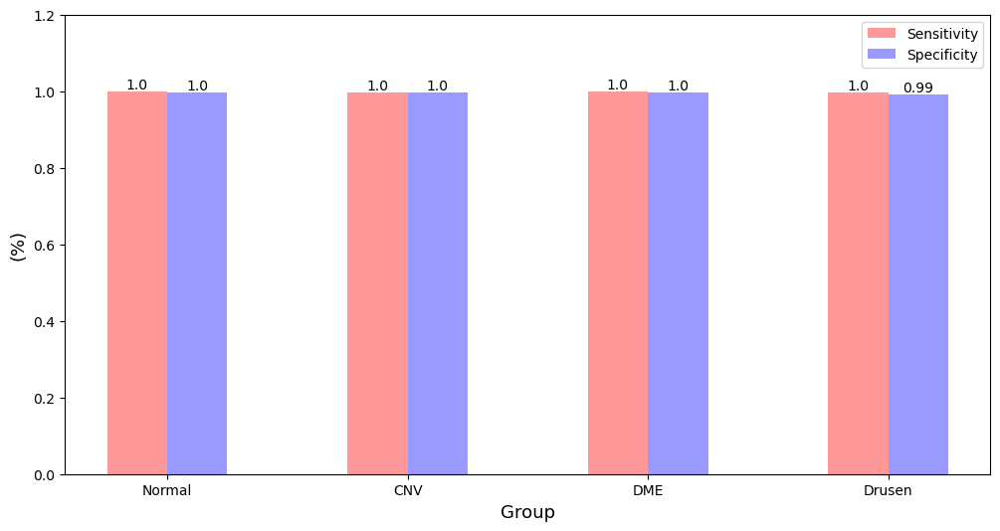

In [250]:
# 그림 사이즈, 바 굵기 조정
fig, ax = plt.subplots(figsize=(12,6))
bar_width = 0.25

# 범주가 4개이므로 0, 1, 2, 3 위치를 기준으로 삼음
index = np.arange(4)

# 각 범주별로 Sensitivity, specificity의 bar를 순서대로 나타내는 과정, 각 그래프는 0.25의 간격을 두고 그려짐
b1 = plt.bar(index, df['Sensitivity'], bar_width, alpha=0.4, color='red', label='Sensitivity')
for i in [0, 1, 2, 3]:
    plt.text(i, df['Sensitivity'][i], str(round(df['Sensitivity'][i],2)), fontsize = 10, color='black',
                horizontalalignment='center',  # horizontalalignment (left, center, right)
                verticalalignment='bottom')    # verticalalignment (top, center, bottom)
b2 = plt.bar(index + bar_width, df['Specificity'], bar_width, alpha=0.4, color='blue', label='Specificity')
for i in [0, 1, 2, 3]:
    plt.text(i+ bar_width, df['Specificity'][i], str(round(df['Specificity'][i],2)), fontsize = 10, color='black',
                horizontalalignment='center',  # horizontalalignment (left, center, right)
                verticalalignment='bottom')    # verticalalignment (top, center, bottom)


# x축 위치를 정 가운데로 조정하고 x축의 텍스트를 year 정보와 매칭
plt.xticks(np.arange(bar_width/2, 4 + bar_width/2, 1), label_list)
plt.yticks(np.arange(0, 1.4, step=0.2))

# x축, y축 이름 및 범례 설정
plt.xlabel('Group', size = 13)
plt.ylabel('(%)', size = 13)
plt.legend()
plt.show()

##### Drawing ROC curve

https://scikit-learn.org/stable/auto_examples/model_selection/plot_roc.html#sphx-glr-auto-examples-model-selection-plot-roc-py

- macro average 는 라벨별 f1-score를 산술평균
- weighted average 는 라벨별 f1-score를 샘플 수(support)의 비중에 따라 가중평균
- micro average는 전체 TP, FN, FP를 평균한 것이며 이것은 다중 분류에서 Accuracy와 같음

In [20]:
from sklearn.preprocessing import LabelBinarizer

label_list = ['Normal', 'CNV', 'DME', 'Drusen']
label_binarizer = LabelBinarizer().fit(answer_list)
y_onehot_test = label_binarizer.transform(answer_list)
y_test = answer_list
y_score = pred_proba_list

class_id = 0        # 여기 수정 필요
class_of_interest = label_list[class_id]

print(y_onehot_test.shape)
print(y_onehot_test.ravel().shape)
print(y_score.shape)

(968, 4)
(3872,)
(968, 4)


In [21]:
print([round(x,2) for temp_list in y_score for x in temp_list])

[0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.99, 0.0, 0.01, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.99, 0.0, 0.01, 0.0, 0.94, 0.06, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0

- ROC curve using micro-averaged OvR

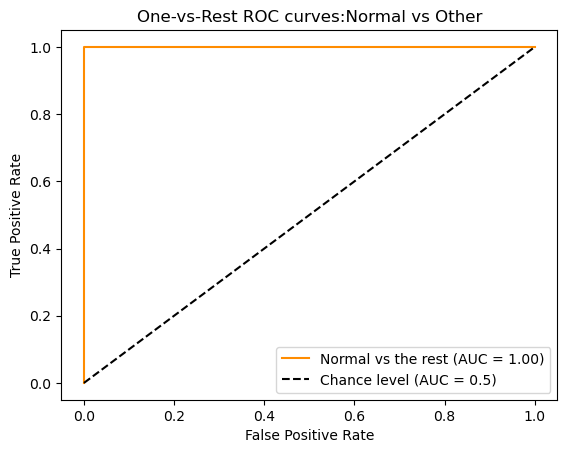

In [22]:
import matplotlib.pyplot as plt
from sklearn.metrics import RocCurveDisplay

display = RocCurveDisplay.from_predictions(
    y_onehot_test[:, class_id],
    y_score[:, class_id],
    name=f"{class_of_interest} vs the rest",
    color="darkorange",
    plot_chance_level=True,
)
_ = display.ax_.set(
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    title=f"One-vs-Rest ROC curves:{label_list[class_id]} vs Other",
)

In [254]:
# AUC만 계산하고 싶은 경우 (ROC-AUC score itself에 초점)
from sklearn.metrics import roc_auc_score

micro_roc_auc_ovr = roc_auc_score(y_test, y_score, multi_class="ovr",average="micro")
print(f"Micro-averaged One-vs-Rest ROC AUC score: {micro_roc_auc_ovr:.2f}")

Micro-averaged One-vs-Rest ROC AUC score: 1.00


In [255]:
# 위의 cell과 같은 의미
from sklearn.metrics import auc, roc_curve

# store the fpr, tpr, and roc_auc for all averaging strategies
fpr, tpr, roc_auc = dict(), dict(), dict()
# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_onehot_test.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

print(f"Micro-averaged One-vs-Rest ROC AUC score:\n{roc_auc['micro']:.2f}")

Micro-averaged One-vs-Rest ROC AUC score:
1.00


- ROC curve using the OvR macro-average

In [256]:
for i in range(len(label_list)):
    fpr[i], tpr[i], _ = roc_curve(y_onehot_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fpr_grid = np.linspace(0.0, 1.0, 1000)

# Interpolate all ROC curves at these points
mean_tpr = np.zeros_like(fpr_grid)

for i in range(len(label_list)):
    mean_tpr += np.interp(fpr_grid, fpr[i], tpr[i])  # linear interpolation

# Average it and compute AUC
mean_tpr /= len(label_list)

fpr["macro"] = fpr_grid
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

print(f"Macro-averaged One-vs-Rest ROC AUC score:\n{roc_auc['macro']:.2f}")

Macro-averaged One-vs-Rest ROC AUC score:
1.00


In [257]:
# 위의 cell과 같은 계산 결과
macro_roc_auc_ovr = roc_auc_score(
    y_test,
    y_score,
    multi_class="ovr",
    average="macro",
)
print(f"Macro-averaged One-vs-Rest ROC AUC score:\n{macro_roc_auc_ovr:.2f}")

Macro-averaged One-vs-Rest ROC AUC score:
1.00


- Plot all OvR ROC curves together

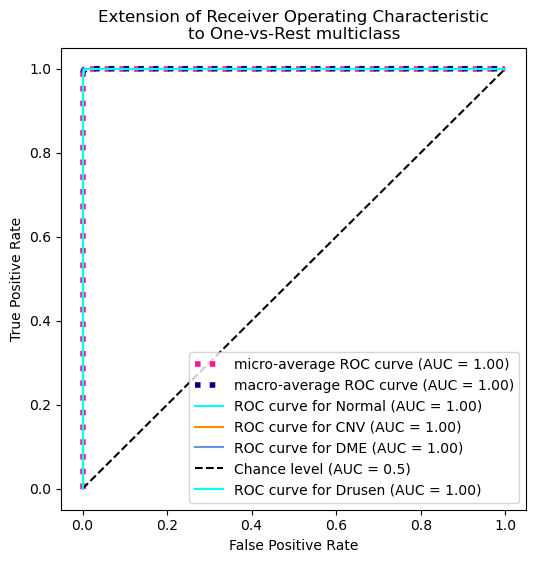

In [258]:
from itertools import cycle

fig, ax = plt.subplots(figsize=(6, 6))

plt.plot(
    fpr["micro"],
    tpr["micro"],
    label=f"micro-average ROC curve (AUC = {roc_auc['micro']:.2f})",
    color="deeppink",
    linestyle=":",
    linewidth=4,
)

plt.plot(
    fpr["macro"],
    tpr["macro"],
    label=f"macro-average ROC curve (AUC = {roc_auc['macro']:.2f})",
    color="navy",
    linestyle=":",
    linewidth=4,
)

colors = cycle(["aqua", "darkorange", "cornflowerblue"])
for class_id, color in zip(range(len(label_list)), colors):
    RocCurveDisplay.from_predictions(
        y_onehot_test[:, class_id],
        y_score[:, class_id],
        name=f"ROC curve for {label_list[class_id]}",
        color=color,
        ax=ax,
        plot_chance_level=(class_id == 2),
    )

_ = ax.set(
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    title="Extension of Receiver Operating Characteristic\nto One-vs-Rest multiclass",
)

- One-vs-One multiclass ROC

In [259]:
from itertools import combinations

pair_list = list(combinations(np.unique(y_test), 2))
print(pair_list)

[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]


Macro-averaged One-vs-One ROC AUC score:
1.00


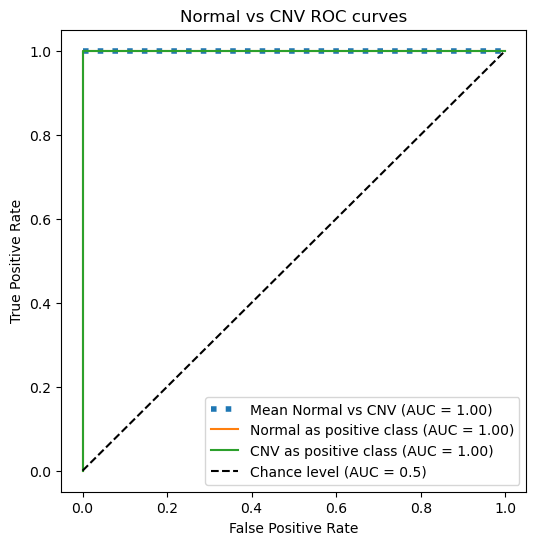

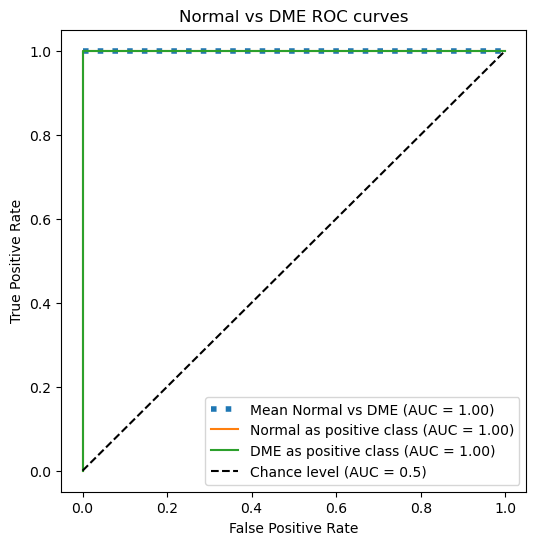

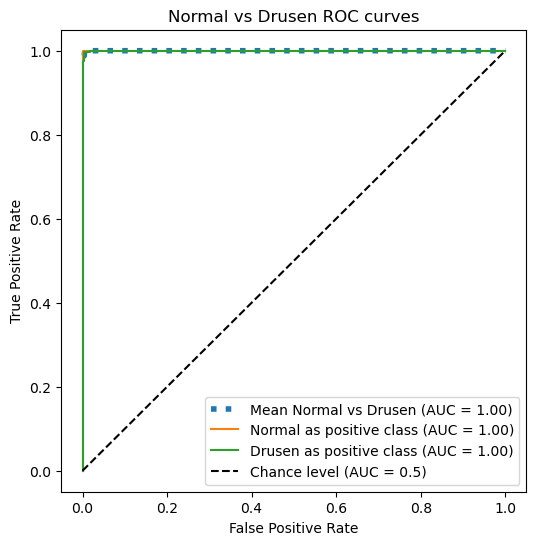

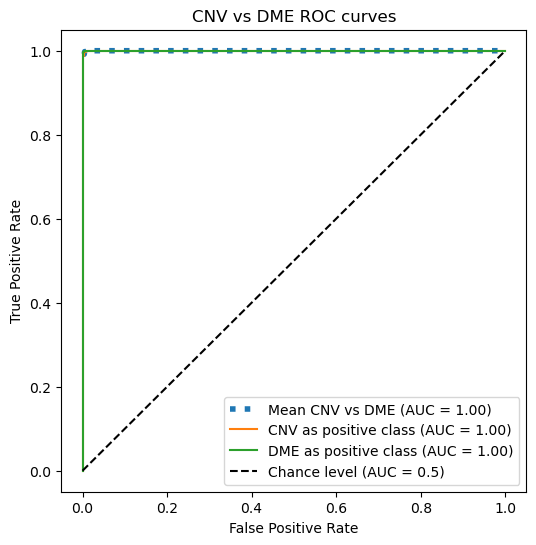

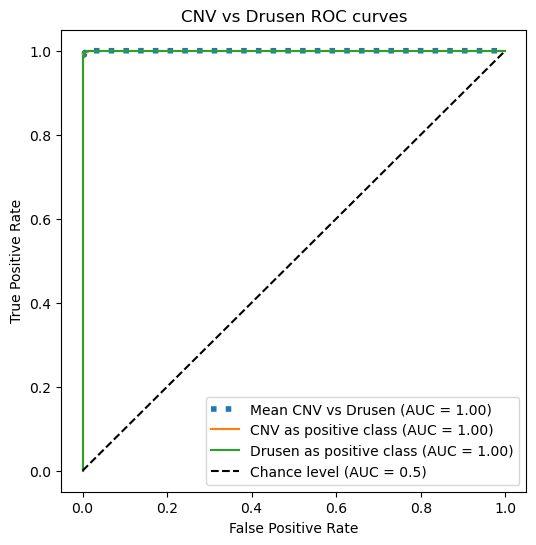

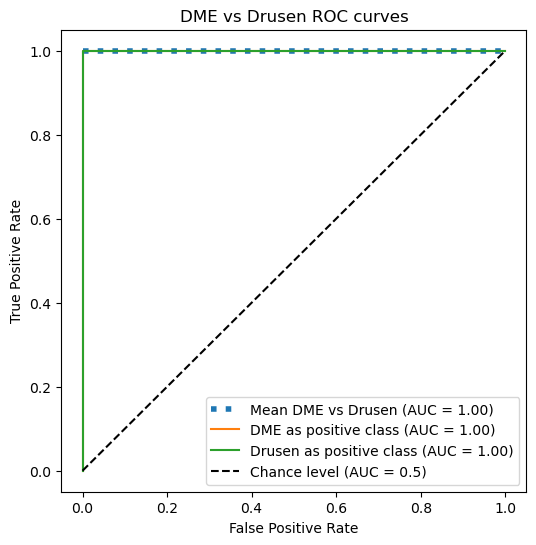

In [260]:
pair_scores = []
mean_tpr = dict()

for ix, (label_a, label_b) in enumerate(pair_list):
    a_mask = y_test == label_a
    b_mask = y_test == label_b
    ab_mask = np.logical_or(a_mask, b_mask)

    a_true = a_mask[ab_mask]
    b_true = b_mask[ab_mask]

    idx_a = np.flatnonzero(label_binarizer.classes_ == label_a)[0]
    idx_b = np.flatnonzero(label_binarizer.classes_ == label_b)[0]

    fpr_a, tpr_a, _ = roc_curve(a_true, y_score[ab_mask, idx_a])
    fpr_b, tpr_b, _ = roc_curve(b_true, y_score[ab_mask, idx_b])

    mean_tpr[ix] = np.zeros_like(fpr_grid)
    mean_tpr[ix] += np.interp(fpr_grid, fpr_a, tpr_a)
    mean_tpr[ix] += np.interp(fpr_grid, fpr_b, tpr_b)
    mean_tpr[ix] /= 2
    mean_score = auc(fpr_grid, mean_tpr[ix])
    pair_scores.append(mean_score)

    fig, ax = plt.subplots(figsize=(6, 6))
    plt.plot(
        fpr_grid,
        mean_tpr[ix],
        label=f"Mean {label_list[label_a]} vs {label_list[label_b]} (AUC = {mean_score :.2f})",
        linestyle=":",
        linewidth=4,
    )
    RocCurveDisplay.from_predictions(
        a_true,
        y_score[ab_mask, idx_a],
        ax=ax,
        name=f"{label_list[label_a]} as positive class",
    )
    RocCurveDisplay.from_predictions(
        b_true,
        y_score[ab_mask, idx_b],
        ax=ax,
        name=f"{label_list[label_b]} as positive class",
        plot_chance_level=True,
    )
    ax.set(
        xlabel="False Positive Rate",
        ylabel="True Positive Rate",
        title=f"{label_list[idx_a]} vs {label_list[label_b]} ROC curves",
    )

print(f"Macro-averaged One-vs-One ROC AUC score:\n{np.average(pair_scores):.2f}")

- Plot all OvO ROC curves together

In [261]:
# AUC만 관심 있으면 아래처럼 하기
macro_roc_auc_ovo = roc_auc_score(
    y_test,
    y_score,
    multi_class="ovo",
    average="macro",
)

print(f"Macro-averaged One-vs-One ROC AUC score:\n{macro_roc_auc_ovo:.2f}")

Macro-averaged One-vs-One ROC AUC score:
1.00


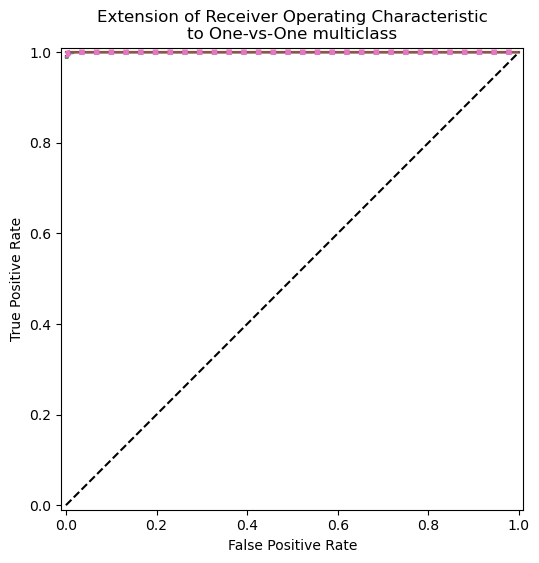

In [262]:
ovo_tpr = np.zeros_like(fpr_grid)

fig, ax = plt.subplots(figsize=(6, 6))
for ix, (label_a, label_b) in enumerate(pair_list):
    ovo_tpr += mean_tpr[ix]
    ax.plot(
        fpr_grid,
        mean_tpr[ix],
        label=f"Mean {label_list[label_a]} vs {label_list[label_b]} (AUC = {pair_scores[ix]:.2f})",
    )

ovo_tpr /= sum(1 for pair in enumerate(pair_list))

ax.plot(
    fpr_grid,
    ovo_tpr,
    label=f"One-vs-One macro-average (AUC = {macro_roc_auc_ovo:.2f})",
    linestyle=":",
    linewidth=4,
)
ax.plot([0, 1], [0, 1], "k--", label="Chance level (AUC = 0.5)")
_ = ax.set(
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    title="Extension of Receiver Operating Characteristic\nto One-vs-One multiclass",
    aspect="equal",
    xlim=(-0.01, 1.01),
    ylim=(-0.01, 1.01),
)


### [Visualization]

##### Visualizing using matplotlib

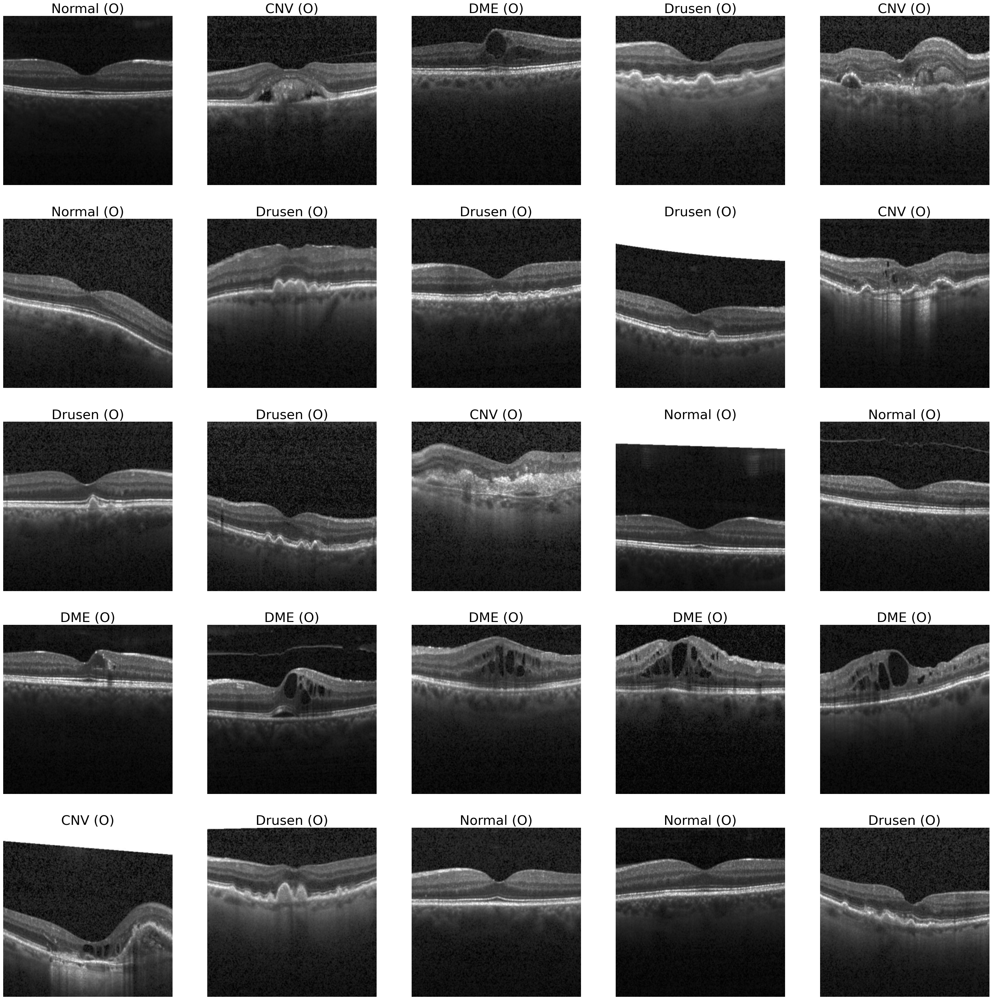

In [263]:
idx2label = dict()
idx2label[0] = 'Normal'
idx2label[1] = 'CNV'
idx2label[2] = 'DME'
idx2label[3] = 'Drusen'

columns = 5
rows = 5
fig = plt.figure(figsize=(40,40))

inception_test.eval()

for i in range(1, columns*rows+1):
    data_idx = np.random.randint(len(test_data))
    input_img = test_data[data_idx][0].unsqueeze(dim=0).to(device) 
    output = inception_test(input_img)
    _, argmax = torch.max(output, 1)
    pred = argmax.item()
    label = test_data[data_idx][1]

    fig.add_subplot(rows, columns, i)
    
    if pred == label:
        plt.title(f'{idx2label[pred]} (O)', fontsize=30)   # 맞은 경우 (O)로 표시
    else:
        plt.title(f'{idx2label[pred]} (X) / ANS: {idx2label[label]}', fontsize=30)   # 틀린 경우 (X)로 표시
    plot_img = test_data[data_idx][0][0]
        # 3channel로 바꾼 경우 다시 원래대로 1channel로 바꿔야 함 아래 마찬가지 / 3channel이라 [0]만 뽑아냄
    plot_img = plot_img * train_std + train_mean    # 이미지를 normalization 이전 상태로 되돌리는 작업
    transforms.functional.to_pil_image(plot_img)
    plt.imshow(plot_img, cmap='gray')
    plt.axis('off')
inception_test.train()
plt.show()

##### Predicted values

<Figure size 1000x1000 with 0 Axes>

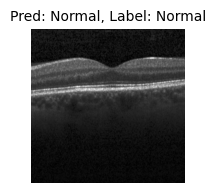

- Normal: 100.0%
- Drusen: 0.0%
- DME: 0.0%
- CNV: 0.0%


<Figure size 1000x1000 with 0 Axes>

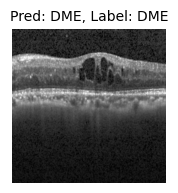

- DME: 100.0%
- CNV: 0.0%
- Drusen: 0.0%
- Normal: 0.0%


<Figure size 1000x1000 with 0 Axes>

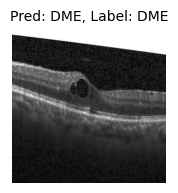

- DME: 100.0%
- CNV: 0.0%
- Drusen: 0.0%
- Normal: 0.0%


<Figure size 1000x1000 with 0 Axes>

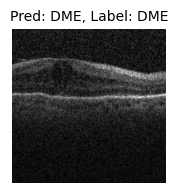

- DME: 99.88%
- CNV: 0.12%
- Normal: 0.0%
- Drusen: 0.0%


<Figure size 1000x1000 with 0 Axes>

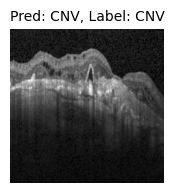

- CNV: 100.0%
- DME: 0.0%
- Drusen: 0.0%
- Normal: 0.0%


TransferInceptionV3(
  (inception): Inception3(
    (Conv2d_1a_3x3): BasicConv2d(
      (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (Conv2d_2a_3x3): BasicConv2d(
      (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (Conv2d_2b_3x3): BasicConv2d(
      (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (Conv2d_3b_1x1): BasicConv2d(
      (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (Conv2d_4a

In [264]:
# 5개의 임의의 image에 대해 percentage 추출하기

idx2label = dict()
idx2label[0] = 'Normal'
idx2label[1] = 'CNV'
idx2label[2] = 'DME'
idx2label[3] = 'Drusen'

label_list = ['Normal', 'CNV', 'DME', 'Drusen']

inception_test.eval()
with torch.no_grad():
    for i in range(1,6):
        fig = plt.figure(figsize=(10,10))
        data_idx = np.random.randint(len(test_data))

        input_img = test_data[data_idx][0].unsqueeze(dim=0).to(device) 
        output = inception_test(input_img)
        label = test_data[data_idx][1]
        pred_percent = F.softmax(output, dim=1)*100
        pred_percent = pred_percent.squeeze().tolist()
        pred_dict = {key: value for key, value in zip(label_list, pred_percent)}
        pred = sorted(pred_dict.items(), key = lambda x: x[1], reverse = True)

        plt.figure(figsize=(2,2))
        plt.imshow(input_img[0][0], cmap='gray')    # 3channel이라 [0]만 뽑아냄
        plt.title(f'Pred: {pred[0][0]}, Label: {idx2label[label]}', fontsize=10)
        plt.axis('off')
        plt.show()
        
        for i in range(len(pred)):
            print(f'- {pred[i][0]}: {round(pred[i][1],2)}%')
    
inception_test.train()

##### GRAD-CAM

- https://csm-kr.tistory.com/74

In [265]:
import os
import cv2
import glob
import numpy as np

def preprocess_image(img):
    means = train_mean  # 나중에는 리스트러 놓기
    stds = train_std    # 나중에는 리스트

    preprocessed_img = img.copy()[:, :, ::-1]
    preprocessed_img = preprocessed_img - means
    preprocessed_img = preprocessed_img/stds
    '''for i in range(3):
        preprocessed_img[:, :, i] = preprocessed_img[:, :, i] - means[i]
        preprocessed_img[:, :, i] = preprocessed_img[:, :, i] / stds[i]'''
    preprocessed_img = \
        np.ascontiguousarray(np.transpose(preprocessed_img, (2, 0, 1)))
    preprocessed_img = torch.from_numpy(preprocessed_img)
    preprocessed_img.unsqueeze_(0)
    input = preprocessed_img.requires_grad_(True)
    return input

def show_cam_on_image(img, mask):
    # mask = (np.max(mask) - np.min(mask)) / (mask - np.min(mask))
    heatmap = cv2.applyColorMap(np.uint8(255 * mask), cv2.COLORMAP_JET)
    heatmap = np.float32(heatmap) / 255
    cam = heatmap + np.float32(img)
    cam = cam / np.max(cam)
    imgRGB = cv2.cvtColor(cam, cv2.COLOR_BGR2RGB)
    return imgRGB

In [266]:
data_dir = '../data/OCT'
test_dir_name = 'test'
test_img_list = sorted(glob.glob(os.path.join(data_dir, test_dir_name, '*','*')))
img_idx = np.random.randint(len(test_img_list))
test_img_path = test_img_list[img_idx]
print(test_img_path)

../data/OCT\test\NORMAL\NORMAL-2181272-1.jpeg


In [267]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class GradCam(nn.Module):
    def __init__(self, model, module1, module2, layer):
        super().__init__()
        self.model = model
        self.module1 = module1
        self.module2 = module2
        self.layer = layer
        self.register_hooks()

    def register_hooks(self):
        for module1_name, module in self.model._modules.items():
            if module1_name == self.module1:
                for module2_name, module in module._modules.items():
                    if module2_name == self.module2:
                        for layer_name, module in module._modules.items():
                            if layer_name == self.layer:
                                module.register_forward_hook(self.forward_hook)
                                module.register_backward_hook(self.backward_hook)

    def forward(self, input, target_index):
        outs = self.model(input)
        outs = outs.squeeze()  # [1, num_classes]  --> [num_classes]
		
        # 가장 큰 값을 가지는 것을 target index 로 사용 
        if target_index is None:
            target_index = outs.argmax()

        outs[target_index].backward(retain_graph=True)
        a_k = torch.mean(self.backward_result, dim=(1, 2), keepdim=True)         # [512, 1, 1]
        out = torch.sum(a_k * self.forward_result, dim=0).cpu()                  # [512, 7, 7] * [512, 1, 1]
        out = torch.relu(out) / torch.max(out)  # 음수를 없애고, 0 ~ 1 로 scaling # [7, 7]
        out = F.upsample_bilinear(out.unsqueeze(0).unsqueeze(0), [299, 299])  # 4D로 바꿈
        return out.cpu().detach().squeeze().numpy()

    def forward_hook(self, _, input, output):
        self.forward_result = torch.squeeze(output)

    def backward_hook(self, _, grad_input, grad_output):
        self.backward_result = torch.squeeze(grad_output[0])

c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torch\nn\modules\module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torch\nn\functional.py:4158: UserWarning: nn.functional.upsample_bilinear is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample_bilinear is deprecated. Use nn.functional.interpolate instead.")


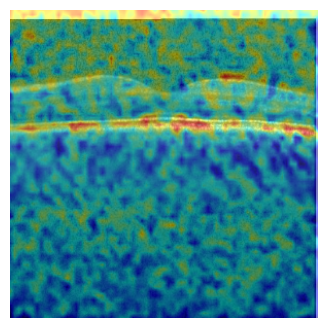

In [268]:
# Inception module이전 transition1의 conv에 적용
inception_test.eval()
grad_cam = GradCam(model=inception_test, module1='inception',module2 ='Conv2d_4a_3x3', layer='conv')
img = cv2.imread(test_img_path, 1)
img = np.float32(cv2.resize(img, (299, 299))) / 255
input = preprocess_image(img)
mask = grad_cam(input, None)
result = show_cam_on_image(img, mask)
plt.axis('off') # 창에있는 x축 y축 제거
plt.imshow(result)
plt.show()

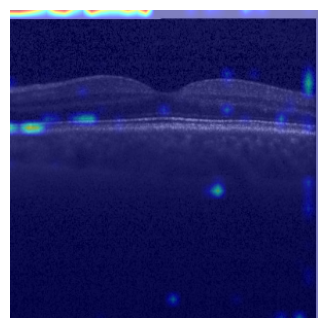

In [269]:
# Mixed 5d (inception module A) 마지막 1x1 conv에 적용
inception_test.eval()
grad_cam = GradCam(model=inception_test.inception, module1='Mixed_5d',module2 ='branch1x1', layer='conv')
img = cv2.imread(test_img_path, 1)
img = np.float32(cv2.resize(img, (299, 299))) / 255
input = preprocess_image(img)
mask = grad_cam(input, None)
result = show_cam_on_image(img, mask)
plt.axis('off') # 창에있는 x축 y축 제거
plt.imshow(result)
plt.show()

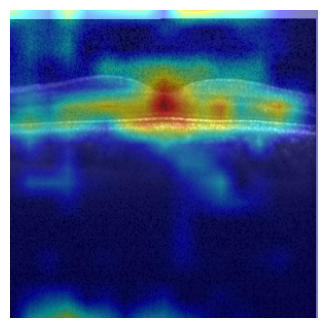

In [270]:
# Mixed 6e (inception module B), Auxiliary logit 통과 직전 layer의 마지막 1x1 conv
inception_test.eval()
grad_cam = GradCam(model=inception_test.inception, module1='Mixed_6e',module2 ='branch1x1', layer='conv')
img = cv2.imread(test_img_path, 1)
img = np.float32(cv2.resize(img, (299, 299))) / 255
input = preprocess_image(img)
mask = grad_cam(input, None)
result = show_cam_on_image(img, mask)
plt.axis('off') # 창에있는 x축 y축 제거
plt.imshow(result)
plt.show()

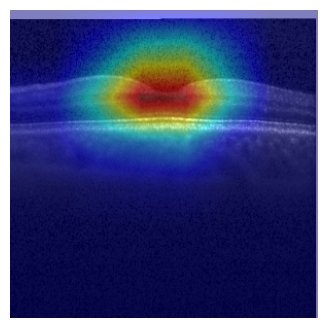

In [271]:
# Mixed 7c (inception module C), FC 통과 직전 layer의 마지막 1x1 conv
inception_test.eval()
grad_cam = GradCam(model=inception_test.inception, module1='Mixed_7c', module2 ='branch1x1', layer='conv')
img = cv2.imread(test_img_path, 1)
img = np.float32(cv2.resize(img, (299, 299))) / 255
input = preprocess_image(img)
mask = grad_cam(input, None)
result = show_cam_on_image(img, mask)
plt.axis('off') # 창에있는 x축 y축 제거
plt.imshow(result)
plt.show()

../data/OCT\test\DME\DME-8457431-1.jpeg


c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torch\nn\modules\module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torch\nn\functional.py:4158: UserWarning: nn.functional.upsample_bilinear is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample_bilinear is deprecated. Use nn.functional.interpolate instead.")


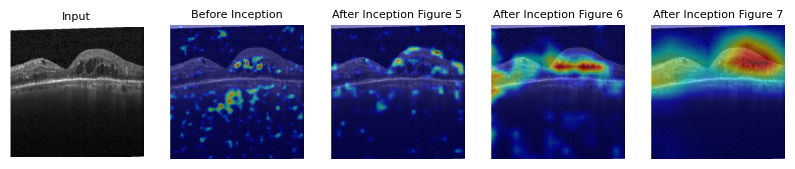

In [289]:
# Grad-CAM by layer
inception_test.eval()

data_dir = '../data/OCT'
test_dir_name = 'test'
test_img_list = sorted(glob.glob(os.path.join(data_dir, test_dir_name, '*','*')))
img_idx = np.random.randint(len(test_img_list))
test_img_path = test_img_list[img_idx]
print(test_img_path)

fig = plt.figure(figsize=(10,120))
fig.add_subplot(1, 5, 1)
plt.title('Input', fontsize=8)
plt.imshow(Image.open(test_img_path), cmap='gray')
plt.axis('off') # 창에있는 x축 y축 제거

for i in range(4,8):
    if i == 4:
        grad_cam = GradCam(model=inception_test, module1='inception', module2 ='Conv2d_4a_3x3', layer='conv')
    elif i == 5:
        grad_cam = GradCam(model=inception_test.inception, module1='Mixed_5d',module2 ='branch1x1', layer='conv')
    elif i == 6:
        grad_cam = GradCam(model=inception_test.inception, module1='Mixed_6e',module2 ='branch1x1', layer='conv')
    elif i == 7:
        grad_cam = GradCam(model=inception_test.inception, module1='Mixed_7c',module2 ='branch1x1', layer='conv')
    
    img = cv2.imread(test_img_path, 1)
    img = np.float32(cv2.resize(img, (299, 299))) / 255
    input = preprocess_image(img)
    mask = grad_cam(input, None)
    result = show_cam_on_image(img, mask)
    fig.add_subplot(1, 5, i-2)
    if i == 4:
        plt.title('Before Inception', fontsize=8)
    else:
        plt.title(f'After Inception Figure {i}', fontsize=8)
    plt.imshow(result)
    plt.axis('off') # 창에있는 x축 y축 제거
plt.show()

##### GRAD-CAM (Another version)

- https://cumulu-s.tistory.com/41
- https://github.com/PeterKim1/paper_code_review/tree/master/9.%20Visual%20Explanations%20from%20Deep%20Networks%20via%20Gradient-based%20Localization(Grad-CAM)

In [290]:
inception_test = TransferInceptionV3(num_classes=4).to(device)
model_path = './saved/ckpoint_14_100.0%.pt'    # .pt 앞에 파일 이름 붙이기
checkpoint = torch.load(model_path, map_location=device)
state_dict = checkpoint['model_state_dict']
inception_test.load_state_dict(state_dict)
inception_test.eval()

c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


TransferInceptionV3(
  (inception): Inception3(
    (Conv2d_1a_3x3): BasicConv2d(
      (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (Conv2d_2a_3x3): BasicConv2d(
      (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (Conv2d_2b_3x3): BasicConv2d(
      (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (Conv2d_3b_1x1): BasicConv2d(
      (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (Conv2d_4a

../data/OCT\test\DRUSEN\DRUSEN-364469-2.jpeg


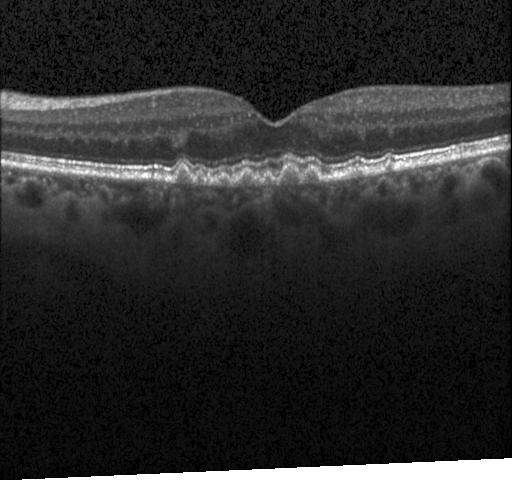

In [291]:
import cv2
from torchvision.utils import make_grid, save_image

data_dir = '../data/OCT'
test_dir_name = 'test'
test_img_list = sorted(glob.glob(os.path.join(data_dir, test_dir_name, '*','*')))
img_idx = np.random.randint(len(test_img_list))
test_img_path = test_img_list[img_idx]
print(test_img_path)

pil_img = Image.open(test_img_path)
pil_img

In [292]:
import datetime

current_time = datetime.datetime.now()
str_time = str(current_time.year)+str('_{0:02d}_'.format(current_time.month))+str('{0:02d}__'.format(current_time.day))+str('{0:02d}_'.format(current_time.hour))+str('{0:02d}'.format(current_time.minute))
dir_name = 'GradCAM_'+str_time

saved_loc = os.path.join('./output/GradCAM', dir_name)
if os.path.exists(saved_loc):
    user_input = input('Warning! rmtree 메소드는 하위 디렉토리 및 모든파일들을 삭제합니다. 계속하겠습니까? (y/n): ')
    if user_input == 'y':
        shutil.rmtree(saved_loc)
    else:
        print('중단되었습니다.')
os.mkdir(saved_loc)

print("결과 저장 위치: ", saved_loc)

결과 저장 위치:  ./output/GradCAM\GradCAM_2024_05_09__01_22


In [293]:
def normalize(tensor, mean, std):
    if not tensor.ndimension() == 4:
        raise TypeError('tensor should be 4D')

    mean = torch.FloatTensor(mean).view(1, 3, 1, 1).expand_as(tensor).to(tensor.device)
    std = torch.FloatTensor(std).view(1, 3, 1, 1).expand_as(tensor).to(tensor.device)

    return tensor.sub(mean).div(std)


class Normalize(object):
    def __init__(self, mean, std):
        self.mean = mean
        self.std = std

    def __call__(self, tensor):
        return self.do(tensor)
    
    def do(self, tensor):
        return normalize(tensor, self.mean, self.std)
    
    def undo(self, tensor):
        return denormalize(tensor, self.mean, self.std)

    def __repr__(self):
        return self.__class__.__name__ + '(mean={0}, std={1})'.format(self.mean, self.std)

In [294]:
normalizer = Normalize(mean=[train_mean, train_mean, train_mean], std=[train_std, train_std, train_std])
transformation = transforms.Compose([
            transforms.Resize([350]),
            transforms.CenterCrop(299),
            transforms.ToTensor(),
        ])
torch_img = transformation(pil_img).squeeze()                                # (1, 299, 29)
torch_img = torch.stack((torch_img, torch_img, torch_img), dim=0).unsqueeze(0)      # (1, 3, 299, 299)
normed_torch_img = normalizer(torch_img) # (1, 3, 299, 299)

In [295]:
trans_for_visualize = transforms.Compose([
            transforms.Resize([350]),
            transforms.CenterCrop(299),
            transforms.ToTensor(),
        ])
img = trans_for_visualize(pil_img).squeeze()    # (1, 299, 299)
img = torch.stack((img, img, img), dim=0)       # (3, 299, 299)

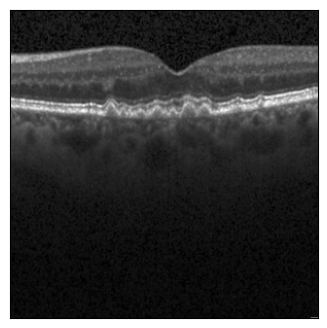

In [296]:
img = np.transpose(img.cpu().numpy().squeeze(), (1, 2, 0)) # (299, 299, 3)
plt.imshow(img)
ax = plt.gca()
ax.axes.xaxis.set_visible(False)
ax.axes.yaxis.set_visible(False)
plt.show()

In [297]:
from torch.autograd import Function

class GuidedBackpropReLU(Function):
    @staticmethod
    def forward(self, input_img):
        # input image 기준으로 양수인 부분만 1로 만드는 positive_mask 생성
        positive_mask = (input_img > 0).type_as(input_img)
        
        # torch.addcmul(input, tensor1, tensor2) => output = input + tensor1 x tensor 2
        # input image와 동일한 사이즈의 torch.zeros를 만든 뒤, input image와 positive_mask를 곱해서 output 생성
        # 결국은 ReLU와 동일한 효과
        output = torch.addcmul(torch.zeros(input_img.size()).type_as(input_img), input_img, positive_mask)
        
        # backward에서 사용될 forward의 input이나 output을 저장
        self.save_for_backward(input_img, output)
        return output

    @staticmethod
    def backward(self, grad_output):
        
        # forward에서 저장된 saved tensor를 불러오기
        input_img, output = self.saved_tensors
        grad_input = None

        # input image 기준으로 양수인 부분만 1로 만드는 positive_mask 생성
        positive_mask_1 = (input_img > 0).type_as(grad_output)
        
        # 모델의 결과 (gradient)가 양수인 부분만 1로 만드는 positive_mask 생성
        positive_mask_2 = (grad_output > 0).type_as(grad_output)
        
        # 먼저 모델의 결과와 positive_mask_1과 곱해주고,
        # 다음으로는 positive_mask_2와 곱해줘서 
        # 모델의 결과가 양수이면서 input image가 양수인 부분만 남도록 만들어줌
        grad_input = torch.addcmul(torch.zeros(input_img.size()).type_as(input_img),
                                   torch.addcmul(torch.zeros(input_img.size()).type_as(input_img), grad_output,
                                                 positive_mask_1), positive_mask_2)
        return grad_input

In [298]:
class GuidedBackpropReLUModel:
    def __init__(self, model, use_cuda):
        self.model = model
        self.model.eval()
        self.cuda = use_cuda
        if self.cuda:
            self.model = model.cuda()

        def recursive_relu_apply(module_top):
            for idx, module in module_top._modules.items():
                recursive_relu_apply(module)
                if module.__class__.__name__ == 'ReLU':
                    module_top._modules[idx] = GuidedBackpropReLU.apply

        # replace ReLU with GuidedBackpropReLU
        recursive_relu_apply(self.model)

    def forward(self, input_img):
        return self.model(input_img)

    def __call__(self, input_img, target_category=None):        # target_category에 원하는 class를 넣기
        if self.cuda:
            input_img = input_img.cuda()

        input_img = input_img.requires_grad_(True)

        output = self.forward(input_img)

        if target_category is None:
            target_category = np.argmax(output.cpu().data.numpy())

        one_hot = np.zeros((1, output.size()[-1]), dtype=np.float32)
        one_hot[0][target_category] = 1 # target_category에 해당하는 번째의 숫자만 1이고 나머지는 다 0
        one_hot = torch.from_numpy(one_hot).requires_grad_(True)
        if self.cuda:
            one_hot = one_hot.cuda()

        one_hot = torch.sum(one_hot * output)   # 원하는 output에 대한 예측만 빼냄
        # 모델이 예측한 결과값을 기준으로 backward 진행
        one_hot.backward(retain_graph=True)

        # input image의 gradient를 저장
        output = input_img.grad.cpu().data.numpy()
        output = output[0, :, :, :]
        output = output.transpose((1, 2, 0))
        return output

In [299]:
def deprocess_image(img):
    """ see https://github.com/jacobgil/keras-grad-cam/blob/master/grad-cam.py#L65 """
    img = img - np.mean(img)
    img = img / (np.std(img) + 1e-5)
    img = img * 0.1
    img = img + 0.5
    img = np.clip(img, 0, 1)
    return np.uint8(img * 255)

In [300]:
# final conv layer name 
finalconv_name = 'branch1x1'

# activations
feature_blobs = []

# gradients
backward_feature = []

# output으로 나오는 feature를 feature_blobs에 append하도록
def hook_feature(module, input, output):
    feature_blobs.append(output.cpu().data)
    

# Grad-CAM
def backward_hook(module, input, output):
    backward_feature.append(output[0])
    

inception_test.inception.Mixed_7c._modules.get(finalconv_name).register_forward_hook(hook_feature)
inception_test.inception.Mixed_7c._modules.get(finalconv_name).register_backward_hook(backward_hook)

In [301]:
# get the softmax weight
params = list(inception_test.parameters())
weight_softmax = np.squeeze(params[-2].cpu().detach().numpy())
# Prediction
logit = inception_test(normed_torch_img)
h_x = F.softmax(logit, dim=1).data.squeeze() # softmax 적용

In [302]:
# ==== Grad-CAM main lines ==== #
_, argmax = torch.max(logit, 1)
label_index = argmax.item() # 0: Normal, 1: CNV, 2: DME, 3:Drusen
print(label_index)

score = logit[:, label_index].squeeze() # 예측값 y^c
score.backward(retain_graph = True) # 예측값 y^c에 대해서 backprop 진행

3


In [303]:
print(np.unique(np.array(feature_blobs)))

[0.0000000e+00 9.7423792e-05 2.8976426e-04 ... 7.0710750e+00 7.1250772e+00
 7.5560679e+00]


In [304]:
print(np.array(feature_blobs).shape)

(1, 1, 320, 8, 8)


In [305]:
print(np.array(backward_feature).shape)

(1, 1, 320, 8, 8)


In [306]:
activations = feature_blobs[0].to(device) # (1, 320, 8, 8), forward pass를 진행하면서 얻게 되는 마지막 conv layer의 feature map: forward activations
gradients = backward_feature[0] # (1, 320, 8, 8), 마지막 conv layer의 feature map의 gradient, backward gradients
b, k, u, v = gradients.size()

alpha = gradients.view(b, k, -1).mean(2) # (1, 320, 8*8) => (1, 320), feature map k의 'importance'를 의미
                                        # 3번째 차원을 기준으로 평균내기
weights = alpha.view(b, k, 1, 1) # (1, 320, 1, 1)

In [307]:
# Linear combination
grad_cam_map = (weights*activations).sum(1, keepdim = True) # alpha * A^k = (1, 320, 8, 8) => (1, 1, 8, 8): 두 번째 차원으로 더해주기
grad_cam_map = F.relu(grad_cam_map) # Apply R e L U -> 여기까지가 아래 (2)번식 구현
grad_cam_map = F.interpolate(grad_cam_map, size=(299, 299), mode='bilinear', align_corners=False) # (1, 1, 299, 299)로 Upsampling
map_min, map_max = grad_cam_map.min(), grad_cam_map.max()
grad_cam_map = (grad_cam_map - map_min).div(map_max - map_min).data # (1, 1, 299, 299), min-max scaling

![image.png](attachment:image.png)

In [308]:
# grad_cam_map.squeeze() : (299, 299)
grad_heatmap = cv2.applyColorMap(np.uint8(255 * grad_cam_map.squeeze().cpu()), cv2.COLORMAP_JET) # (299, 299, 3), numpy

# Grad-CAM heatmap save
cv2.imwrite(os.path.join(saved_loc, "Grad_CAM_heatmap.jpg"), grad_heatmap)

grad_heatmap = np.float32(grad_heatmap) / 255

grad_result = grad_heatmap + img
grad_result = grad_result / np.max(grad_result)
grad_result = np.uint8(255 * grad_result)

# Grad-CAM Result save
cv2.imwrite(os.path.join(saved_loc, "Grad_Result.jpg"), grad_result)

True

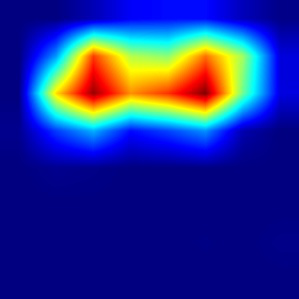

In [309]:
Image.open(os.path.join(saved_loc, "Grad_CAM_heatmap.jpg"))

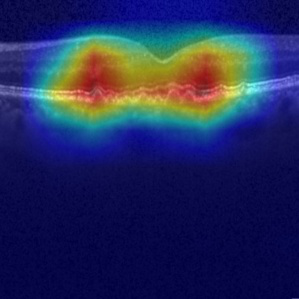

In [310]:
Image.open(os.path.join(saved_loc, "Grad_Result.jpg"))

In [311]:
# ==Guided-Backprop main lines= #
# gb_model => ReLU function in resnet50 change to GuidedBackpropReLU.
gb_model = GuidedBackpropReLUModel(model=inception_test, use_cuda=False)    # inception_test내 ReLU를 GuidedBackpropReLU로 바꾸기
gb_num = gb_model(torch_img, target_category = label_index) # 이 모델에 image를 투입하여 얻게 되는 Guided Backpropagation 이미지는 gb_num
gb = deprocess_image(gb_num) # (299, 299, 3), numpy

# Guided Backprop save
cv2.imwrite(os.path.join(saved_loc, "Guided_Backprop.jpg"), gb)

True

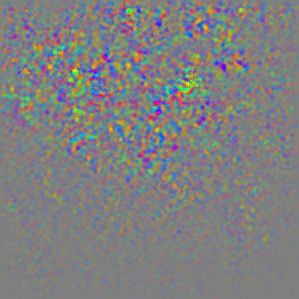

In [312]:
Image.open(os.path.join(saved_loc, "Guided_Backprop.jpg"))

In [313]:
# Guided-Backpropagation * Grad-CAM => Guided Grad-CAM 
# See Fig. 2 in paper.
# grad_cam_map : (1, 1, 299, 299) , torch.Tensor
grayscale_cam = grad_cam_map.squeeze(0).cpu().numpy() # (1, 299, 299), numpy
grayscale_cam = grayscale_cam[0, :] # (299, 299)
cam_mask = cv2.merge([grayscale_cam, grayscale_cam, grayscale_cam]) # (299, 299, 3) 이렇게 합쳐주기

cam_gb = deprocess_image(cam_mask * gb_num) # Guidedbackpropmodel에 img 투입해서 얻은 output인 gb_num과 mask를 곱하기

# Guided Grad-CAM save
cv2.imwrite(os.path.join(saved_loc, "Guided_Grad_CAM.jpg"), cam_gb)

True

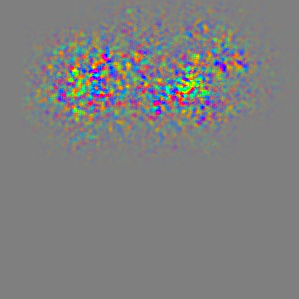

In [314]:
Image.open(os.path.join(saved_loc, "Guided_Grad_CAM.jpg"))

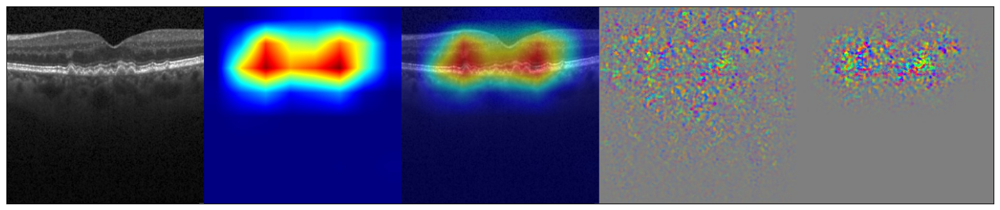

In [315]:
# 그림 만들기
pil_img = Image.open(test_img_path)
pil_transform = transforms.Compose([
            transforms.Resize([350]),
            transforms.CenterCrop(299),
        ])

Original_image = cv2.cvtColor(np.array(pil_transform(pil_img)), cv2.COLOR_RGB2BGR) # Pil -> Open CV
G_heatmap = cv2.cvtColor(cv2.imread(os.path.join(saved_loc, "Grad_CAM_heatmap.jpg")), cv2.COLOR_BGR2RGB)
G_result = cv2.cvtColor(cv2.imread(os.path.join(saved_loc, "Grad_Result.jpg")), cv2.COLOR_BGR2RGB)
G_Back = cv2.cvtColor(cv2.imread(os.path.join(saved_loc, "Guided_Backprop.jpg")), cv2.COLOR_BGR2RGB)
G_CAM = cv2.cvtColor(cv2.imread(os.path.join(saved_loc, "Guided_Grad_CAM.jpg")), cv2.COLOR_BGR2RGB)

Total = cv2.hconcat([Original_image, G_heatmap, G_result, G_Back, G_CAM])

plt.rcParams["figure.figsize"] = (20, 4)
plt.imshow(Total)
ax = plt.gca()
ax.axes.xaxis.set_visible(False)
ax.axes.yaxis.set_visible(False)
plt.savefig(os.path.join(saved_loc, "Final_result.jpg"))
plt.show()

# 왼쪽에서부터 input - Grad-CAM - Grad-CAM - Guide-backprop - Guide-Grad-CAM 순서

### [Final test visualization]
= Input image + prediction + label + predicted percentage + GRAD-CAM + Guide-backprop + Guide-Grad-CAM

- Model construction

In [197]:
inception_test = TransferInceptionV3(num_classes=4).to(device)
model_path = './saved/ckpoint_14_100.0%.pt'    # .pt 앞에 파일 이름 붙이기
checkpoint = torch.load(model_path, map_location=device)
state_dict = checkpoint['model_state_dict']
inception_test.load_state_dict(state_dict)
inception_test.eval()

c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


TransferInceptionV3(
  (inception): Inception3(
    (Conv2d_1a_3x3): BasicConv2d(
      (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (Conv2d_2a_3x3): BasicConv2d(
      (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (Conv2d_2b_3x3): BasicConv2d(
      (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (Conv2d_3b_1x1): BasicConv2d(
      (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (Conv2d_4a

- ##### Select input image and make prediction using Inception V3

In [198]:
import datetime

def make_saved_dir(dir):
    current_time = datetime.datetime.now()
    str_time = str(current_time.year)+str('_{0:02d}_'.format(current_time.month))+str('{0:02d}__'.format(current_time.day))+str('{0:02d}_'.format(current_time.hour))+str('{0:02d}'.format(current_time.minute))
    dir_name = 'Final_output_'+str_time

    saved_loc = os.path.join(dir, dir_name)
    if os.path.exists(saved_loc):
        user_input = input('Warning! rmtree 메소드는 하위 디렉토리 및 모든파일들을 삭제합니다. 계속하겠습니까? (y/n): ')
        if user_input == 'y':
            shutil.rmtree(saved_loc)
        else:
            print('중단되었습니다.')
    os.mkdir(saved_loc)

    print("결과 저장 위치: ", saved_loc)
    return saved_loc

In [199]:
def normalize(tensor, mean, std):
    if not tensor.ndimension() == 4:
        raise TypeError('tensor should be 4D')

    mean = torch.FloatTensor(mean).view(1, 3, 1, 1).expand_as(tensor).to(tensor.device)
    std = torch.FloatTensor(std).view(1, 3, 1, 1).expand_as(tensor).to(tensor.device)

    return tensor.sub(mean).div(std)


class Normalize(object):
    def __init__(self, mean, std):
        self.mean = mean
        self.std = std

    def __call__(self, tensor):
        return self.do(tensor)
    
    def do(self, tensor):
        return normalize(tensor, self.mean, self.std)
    
    def undo(self, tensor):
        return denormalize(tensor, self.mean, self.std)

    def __repr__(self):
        return self.__class__.__name__ + '(mean={0}, std={1})'.format(self.mean, self.std)


def select_input_img(data_dir, test_dir_name):
    '''
    Input:  data_dir = path of directory which contains data
            test_dir_name = name of directory wich contains test data
    Output: image opened by PIL.Image
    '''
    test_img_list = sorted(glob.glob(os.path.join(data_dir, test_dir_name, '*','*')))
    img_idx = np.random.randint(len(test_img_list))
    test_img_path = test_img_list[img_idx]
    pil_img = Image.open(test_img_path)
    return test_img_path, pil_img


def img_to_tensor(train_mean, train_std, pil_img):
    '''
    Input:  pil_img = image opened by PIL.Image
    Output: transformed image tensor with size (3,299,299)
    '''
    normalizer = Normalize(mean=[train_mean, train_mean, train_mean], std=[train_std, train_std, train_std])
    transformation = transforms.Compose([
            transforms.Resize([350]),
            transforms.CenterCrop(299),
            transforms.ToTensor(),
        ])
    pil_img_tf = transformation(pil_img).squeeze()                          # (1, 299, 299)
    pil_img_tf = torch.stack((pil_img_tf, pil_img_tf, pil_img_tf), dim=0)   # (3, 299, 299)
    normed_pil_img_tf = normalizer(pil_img_tf.unsqueeze(0))
    return pil_img_tf, normed_pil_img_tf


def make_pred(model, input):
    '''
    Input:  model = our model (in this case, InceptionV3 after transfer learning)
            input = input image (in this case, tensor image with size (3, 299, 299))
    Output: output = 4 number tensor, actual output made by our model
            pred = integer, prediction made by our model (result of argmax of our output)
    '''
    output = model(input)
    _, argmax = torch.max(output, 1)
    pred = argmax.item()
    return output, pred


def find_label(img_path):
    '''
    Input:  img_path = path of certain image
    Output: String, Label of the image
    '''
    _, file_name = os.path.split(img_path)
    file_name_list = file_name.split('-')
    label = file_name_list[0]
    return label

In [201]:
# Index to label, label to index dictionary
idx2label = {0: 'Normal', 1: 'CNV',
             2: 'DME', 3: 'Drusen'}
    # CNV: Choroidal neovascularization, DME: Diabetic macular edema
label2idx = {v:k for k,v in idx2label.items()}

# Label list
label_list = ['Normal', 'CNV', 'DME', 'Drusen']

# Select input image and Image transformation
test_img_path, pil_img = select_input_img(data_dir = '../data/OCT', test_dir_name = 'test')
pil_img_tf, normed_pil_img_tf = img_to_tensor(train_mean, train_std, pil_img)    # (1, 3, 299, 299)
print(test_img_path)

img = np.transpose(pil_img_tf.cpu().numpy().squeeze(), (1, 2, 0)) # (299, 299, 3)

saved_loc = make_saved_dir(dir='./output/Final_output')

../data/OCT\test\DME\DME-8732456-1.jpeg
결과 저장 위치:  ./output/Final_output\Final_output_2024_05_09__02_12


In [202]:
def make_pred_bar_chart(output, saved_loc, label_list, subtitle_fontdict):
    '''
    Input:  output = outcome came from InceptionV3
            subplot = Certain subplot of matplotlib
            label_list = list with label
    Output: Bar chart
    '''
    with torch.no_grad():
        # Prediction 계산
        pred_percent = F.softmax(output, dim=1)*100
        pred_percent = pred_percent.squeeze().tolist()
        pred_percent = [round(x,2) for x in pred_percent]

    # chart 그리기
    plt.rcParams["figure.figsize"] = (8,8)
    plt.bar(label_list, pred_percent, color='blue', alpha = 0.4)
    plt.xticks([0, 1, 2, 3], label = label_list, **subtitle_fontdict)
    
    for i, v in enumerate([0, 1, 2, 3]):
        plt.text(v, pred_percent[i], str(pred_percent[i])+'%', fontsize = 15, color='black',
                    horizontalalignment='center',  # horizontalalignment (left, center, right)
                    verticalalignment='bottom')    # verticalalignment (top, center, bottom)

    plt.savefig(os.path.join(saved_loc, "Prediction_bar_chart.jpg"), format='jpeg')

- ##### Predicted percentage

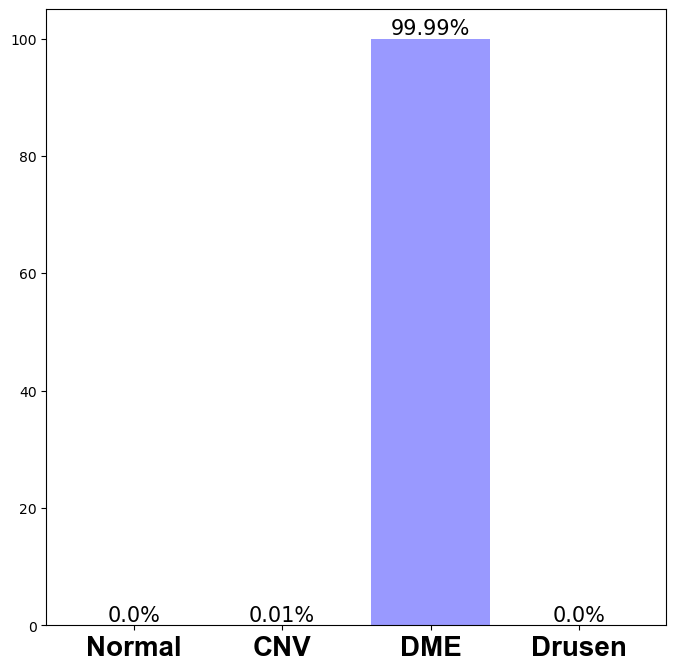

In [203]:
# Make prediction using InceptionV3
output, pred = make_pred(model = inception_test, input = normed_pil_img_tf)

# Find label of the input image
label = find_label(img_path=test_img_path)
if label.lower() == 'normal':
    label = label.capitalize()
elif label.lower() == 'drusen':
    label = label.capitalize()

# Make table of prediction
subtitle_fontdict={'fontname': 'Arial','fontsize': 20, 'fontweight': 'bold'}
make_pred_bar_chart(output = output, saved_loc=saved_loc, label_list = label_list, subtitle_fontdict=subtitle_fontdict)

- ##### Grad-CAM + Guided Grad-CAM

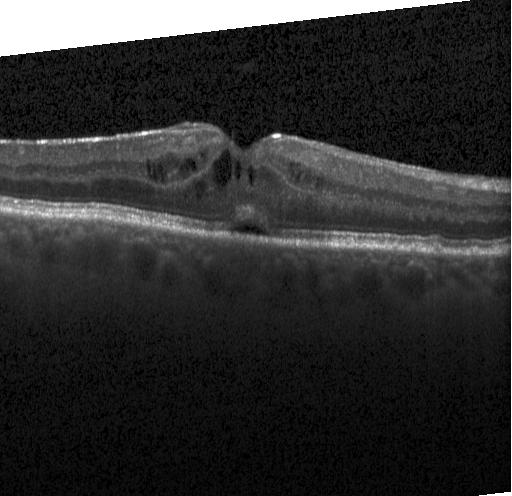

In [204]:
import cv2
from torchvision.utils import make_grid, save_image

pil_img = Image.open(test_img_path)
pil_img

In [205]:
def normalize(tensor, mean, std):
    if not tensor.ndimension() == 4:
        raise TypeError('tensor should be 4D')

    mean = torch.FloatTensor(mean).view(1, 3, 1, 1).expand_as(tensor).to(tensor.device)
    std = torch.FloatTensor(std).view(1, 3, 1, 1).expand_as(tensor).to(tensor.device)

    return tensor.sub(mean).div(std)


class Normalize(object):
    def __init__(self, mean, std):
        self.mean = mean
        self.std = std

    def __call__(self, tensor):
        return self.do(tensor)
    
    def do(self, tensor):
        return normalize(tensor, self.mean, self.std)
    
    def undo(self, tensor):
        return denormalize(tensor, self.mean, self.std)

    def __repr__(self):
        return self.__class__.__name__ + '(mean={0}, std={1})'.format(self.mean, self.std)

normalizer = Normalize(mean=[train_mean, train_mean, train_mean], std=[train_std, train_std, train_std])
transformation = transforms.Compose([
            transforms.Resize([350]),
            transforms.CenterCrop(299),
            transforms.ToTensor(),
        ])
torch_img = transformation(pil_img).squeeze()                                       # (1, 299, 299)
torch_img = torch.stack((torch_img, torch_img, torch_img), dim=0).unsqueeze(0)      # (1, 3, 299, 299)
normed_torch_img = normalizer(torch_img) # (1, 3, 299, 299)

In [206]:
trans_for_visualize = transforms.Compose([
            transforms.Resize([350]),
            transforms.CenterCrop(299),
            transforms.ToTensor(),
        ])
img = trans_for_visualize(pil_img).squeeze()    # (1, 299, 299)
img = torch.stack((img, img, img), dim=0)       # (3, 299, 299)

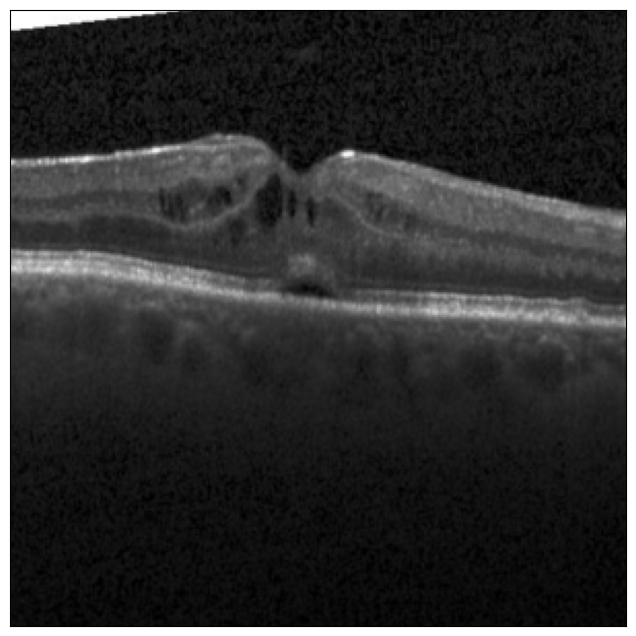

In [207]:
img = np.transpose(img.cpu().numpy().squeeze(), (1, 2, 0)) # (299, 299, 3)
plt.imshow(img)
ax = plt.gca()
ax.axes.xaxis.set_visible(False)
ax.axes.yaxis.set_visible(False)
plt.show()

In [208]:
from torch.autograd import Function

class GuidedBackpropReLU(Function):
    @staticmethod
    def forward(self, input_img):
        # input image 기준으로 양수인 부분만 1로 만드는 positive_mask 생성
        positive_mask = (input_img > 0).type_as(input_img)
        
        # torch.addcmul(input, tensor1, tensor2) => output = input + tensor1 x tensor 2
        # input image와 동일한 사이즈의 torch.zeros를 만든 뒤, input image와 positive_mask를 곱해서 output 생성
        # 결국은 ReLU와 동일한 효과
        output = torch.addcmul(torch.zeros(input_img.size()).type_as(input_img), input_img, positive_mask)
        
        # backward에서 사용될 forward의 input이나 output을 저장
        self.save_for_backward(input_img, output)
        return output

    @staticmethod
    def backward(self, grad_output):
        
        # forward에서 저장된 saved tensor를 불러오기
        input_img, output = self.saved_tensors
        grad_input = None

        # input image 기준으로 양수인 부분만 1로 만드는 positive_mask 생성
        positive_mask_1 = (input_img > 0).type_as(grad_output)
        
        # 모델의 결과 (gradient)가 양수인 부분만 1로 만드는 positive_mask 생성
        positive_mask_2 = (grad_output > 0).type_as(grad_output)
        
        # 먼저 모델의 결과와 positive_mask_1과 곱해주고,
        # 다음으로는 positive_mask_2와 곱해줘서 
        # 모델의 결과가 양수이면서 input image가 양수인 부분만 남도록 만들어줌
        grad_input = torch.addcmul(torch.zeros(input_img.size()).type_as(input_img),
                                   torch.addcmul(torch.zeros(input_img.size()).type_as(input_img), grad_output,
                                                 positive_mask_1), positive_mask_2)
        return grad_input

class GuidedBackpropReLUModel:
    def __init__(self, model, use_cuda):
        self.model = model
        self.model.eval()
        self.cuda = use_cuda
        if self.cuda:
            self.model = model.cuda()

        def recursive_relu_apply(module_top):
            for idx, module in module_top._modules.items():
                recursive_relu_apply(module)
                if module.__class__.__name__ == 'ReLU':
                    module_top._modules[idx] = GuidedBackpropReLU.apply

        # replace ReLU with GuidedBackpropReLU
        recursive_relu_apply(self.model)

    def forward(self, input_img):
        return self.model(input_img)

    def __call__(self, input_img, target_category=None):        # target_category에 원하는 class를 넣기
        if self.cuda:
            input_img = input_img.cuda()

        input_img = input_img.requires_grad_(True)

        output = self.forward(input_img)

        if target_category is None:
            target_category = np.argmax(output.cpu().data.numpy())

        one_hot = np.zeros((1, output.size()[-1]), dtype=np.float32)
        one_hot[0][target_category] = 1 # target_category에 해당하는 번째의 숫자만 1이고 나머지는 다 0
        one_hot = torch.from_numpy(one_hot).requires_grad_(True)
        if self.cuda:
            one_hot = one_hot.cuda()

        one_hot = torch.sum(one_hot * output)   # 원하는 output에 대한 예측만 빼냄
        # 모델이 예측한 결과값을 기준으로 backward 진행
        one_hot.backward(retain_graph=True)

        # input image의 gradient를 저장
        output = input_img.grad.cpu().data.numpy()
        output = output[0, :, :, :]
        output = output.transpose((1, 2, 0))
        return output

def deprocess_image(img):
    """ see https://github.com/jacobgil/keras-grad-cam/blob/master/grad-cam.py#L65 """
    img = img - np.mean(img)
    img = img / (np.std(img) + 1e-5)
    img = img * 0.1
    img = img + 0.5
    img = np.clip(img, 0, 1)
    return np.uint8(img * 255)

In [209]:
# final conv layer name 
finalconv_name = 'branch1x1'

# activations
feature_blobs = []

# gradients
backward_feature = []

# output으로 나오는 feature를 feature_blobs에 append하도록
def hook_feature(module, input, output):
    feature_blobs.append(output.cpu().data)
    

# Grad-CAM
def backward_hook(module, input, output):
    backward_feature.append(output[0])
    

inception_test.inception.Mixed_7c._modules.get(finalconv_name).register_forward_hook(hook_feature)
inception_test.inception.Mixed_7c._modules.get(finalconv_name).register_backward_hook(backward_hook)

# get the softmax weight
params = list(inception_test.parameters())
weight_softmax = np.squeeze(params[-2].cpu().detach().numpy())
# Prediction
logit = inception_test(normed_torch_img)
h_x = F.softmax(logit, dim=1).data.squeeze() # softmax 적용

# ==== Grad-CAM main lines ==== #
_, argmax = torch.max(logit, 1)
label_index = argmax.item() # 0: Normal, 1: CNV, 2: DME, 3:Drusen
print(label_index)

score = logit[:, label_index].squeeze() # 예측값 y^c
score.backward(retain_graph = True) # 예측값 y^c에 대해서 backprop 진행

activations = feature_blobs[0].to(device) # (1, 320, 8, 8), forward pass를 진행하면서 얻게 되는 마지막 conv layer의 feature map: forward activations
gradients = backward_feature[0] # (1, 320, 8, 8), 마지막 conv layer의 feature map의 gradient, backward gradients
b, k, u, v = gradients.size()

alpha = gradients.view(b, k, -1).mean(2) # (1, 320, 8*8) => (1, 320), feature map k의 'importance'를 의미
                                        # 3번째 차원을 기준으로 평균내기
weights = alpha.view(b, k, 1, 1) # (1, 320, 1, 1)

# Linear combination
grad_cam_map = (weights*activations).sum(1, keepdim = True) # alpha * A^k = (1, 320, 8, 8) => (1, 1, 8, 8): 두 번째 차원으로 더해주기
grad_cam_map = F.relu(grad_cam_map) # Apply R e L U -> 여기까지가 아래 (2)번식 구현
grad_cam_map = F.interpolate(grad_cam_map, size=(299, 299), mode='bilinear', align_corners=False) # (1, 1, 299, 299)로 Upsampling
map_min, map_max = grad_cam_map.min(), grad_cam_map.max()
grad_cam_map = (grad_cam_map - map_min).div(map_max - map_min).data # (1, 1, 299, 299), min-max scaling

# grad_cam_map.squeeze()
grad_heatmap = cv2.applyColorMap(np.uint8(255 * grad_cam_map.squeeze().cpu()), cv2.COLORMAP_JET) # (299, 299, 3), numpy

# Grad-CAM heatmap save
cv2.imwrite(os.path.join(saved_loc, "Grad_CAM_heatmap.jpg"), grad_heatmap)

grad_heatmap = np.float32(grad_heatmap) / 255

grad_result = grad_heatmap + img
grad_result = grad_result / np.max(grad_result)
grad_result = np.uint8(255 * grad_result)

# Grad-CAM Result save
cv2.imwrite(os.path.join(saved_loc, "Grad_Result.jpg"), grad_result)

c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torch\nn\modules\module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


2


True

In [210]:
# ==Guided-Backprop main lines= #
# gb_model => ReLU function in resnet50 change to GuidedBackpropReLU.
gb_model = GuidedBackpropReLUModel(model=inception_test, use_cuda=False)    # inception_test 안에 ReLU를 GuidedBackpropReLU로 바꾸기
gb_num = gb_model(torch_img, target_category = label_index) # 이 모델에 image를 투입하여 얻게 되는 Guided Backpropagation 이미지는 gb_num
gb = deprocess_image(gb_num) # (299, 299, 3), numpy

# Guided Backprop save
cv2.imwrite(os.path.join(saved_loc, "Guided_Backprop.jpg"), gb)

# Guided-Backpropagation * Grad-CAM => Guided Grad-CAM 
# See Fig. 2 in paper.
# grad_cam_map : (1, 1, 299, 299) , torch.Tensor
grayscale_cam = grad_cam_map.squeeze(0).cpu().numpy() # (1, 299, 299), numpy
grayscale_cam = grayscale_cam[0, :] # (299, 299)
cam_mask = cv2.merge([grayscale_cam, grayscale_cam, grayscale_cam]) # (299, 299, 3) 이렇게 합쳐주기

cam_gb = deprocess_image(cam_mask * gb_num) # Guidedbackpropmodel에 img 투입해서 얻은 output인 gb_num과 mask를 곱하기

# Guided Grad-CAM save
cv2.imwrite(os.path.join(saved_loc, "Guided_Grad_CAM.jpg"), cam_gb)

True

- ##### Grad-CAM by layer

In [211]:
# Reload model
inception_test = TransferInceptionV3(num_classes=4).to(device)
model_path = './saved/ckpoint_14_100.0%.pt'    # .pt 앞에 파일 이름 붙이기
checkpoint = torch.load(model_path, map_location=device)
state_dict = checkpoint['model_state_dict']
inception_test.load_state_dict(state_dict)
inception_test.eval()

c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


TransferInceptionV3(
  (inception): Inception3(
    (Conv2d_1a_3x3): BasicConv2d(
      (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (Conv2d_2a_3x3): BasicConv2d(
      (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (Conv2d_2b_3x3): BasicConv2d(
      (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (Conv2d_3b_1x1): BasicConv2d(
      (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (Conv2d_4a

In [212]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class GradCam(nn.Module):
    def __init__(self, model, module1, module2, layer):
        super().__init__()
        self.model = model
        self.module1 = module1
        self.module2 = module2
        self.layer = layer
        self.register_hooks()

    def register_hooks(self):
        for module1_name, module in self.model._modules.items():
            if module1_name == self.module1:
                for module2_name, module in module._modules.items():
                    if module2_name == self.module2:
                        for layer_name, module in module._modules.items():
                            if layer_name == self.layer:
                                module.register_forward_hook(self.forward_hook)
                                module.register_backward_hook(self.backward_hook)

    def forward(self, input, target_index):
        outs = self.model(input)
        outs = outs.squeeze()  # [1, num_classes]  --> [num_classes]
		
        # 가장 큰 값을 가지는 것을 target index 로 사용 
        if target_index is None:
            target_index = outs.argmax()

        outs[target_index].backward(retain_graph=True)
        a_k = torch.mean(self.backward_result, dim=(1, 2), keepdim=True)         # [512, 1, 1]
        out = torch.sum(a_k * self.forward_result, dim=0).cpu()                  # [512, 7, 7] * [512, 1, 1]
        out = torch.relu(out) / torch.max(out)  # 음수를 없애고, 0 ~ 1 로 scaling # [7, 7]
        out = F.upsample_bilinear(out.unsqueeze(0).unsqueeze(0), [299, 299])  # 4D로 바꿈
        return out.cpu().detach().squeeze().numpy()

    def forward_hook(self, _, input, output):
        self.forward_result = torch.squeeze(output)

    def backward_hook(self, _, grad_input, grad_output):
        self.backward_result = torch.squeeze(grad_output[0])

import os
import cv2
import glob
import numpy as np

def preprocess_image(img):
    means = train_mean  # 나중에는 리스트러 놓기
    stds = train_std    # 나중에는 리스트

    preprocessed_img = img.copy()[:, :, ::-1]
    preprocessed_img = preprocessed_img - means
    preprocessed_img = preprocessed_img/stds
    '''for i in range(3):
        preprocessed_img[:, :, i] = preprocessed_img[:, :, i] - means[i]
        preprocessed_img[:, :, i] = preprocessed_img[:, :, i] / stds[i]'''
    preprocessed_img = \
        np.ascontiguousarray(np.transpose(preprocessed_img, (2, 0, 1)))
    preprocessed_img = torch.from_numpy(preprocessed_img)
    preprocessed_img.unsqueeze_(0)
    input = preprocessed_img.requires_grad_(True)
    return input

c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torch\nn\functional.py:4158: UserWarning: nn.functional.upsample_bilinear is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample_bilinear is deprecated. Use nn.functional.interpolate instead.")


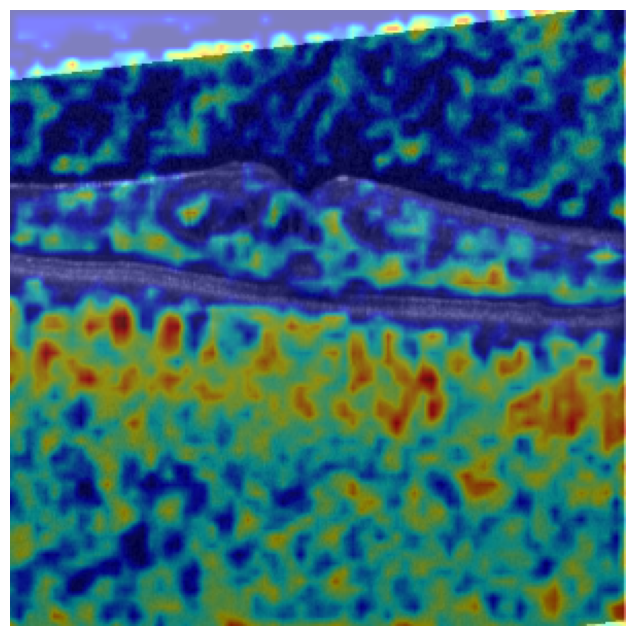

c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torch\nn\modules\module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torch\nn\functional.py:4158: UserWarning: nn.functional.upsample_bilinear is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample_bilinear is deprecated. Use nn.functional.interpolate instead.")


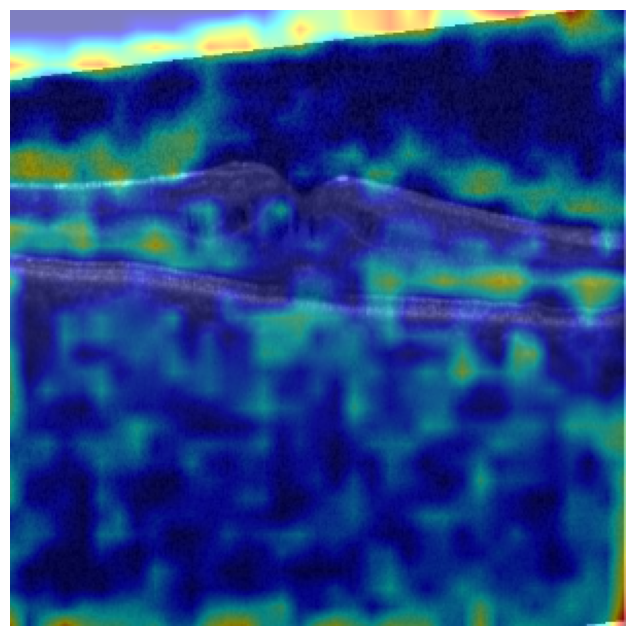

c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torch\nn\modules\module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torch\nn\functional.py:4158: UserWarning: nn.functional.upsample_bilinear is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample_bilinear is deprecated. Use nn.functional.interpolate instead.")


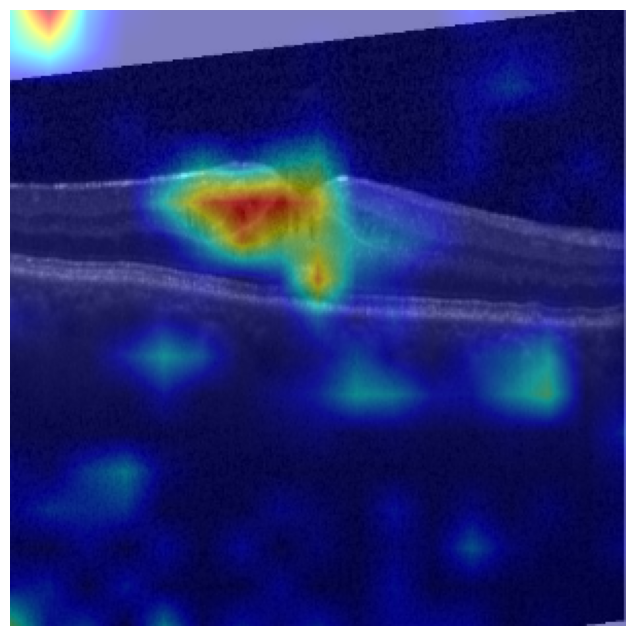

c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torch\nn\modules\module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torch\nn\functional.py:4158: UserWarning: nn.functional.upsample_bilinear is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample_bilinear is deprecated. Use nn.functional.interpolate instead.")


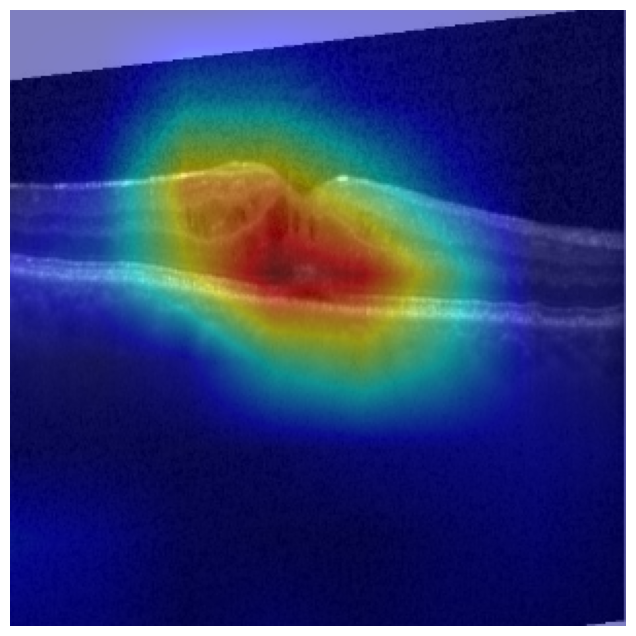

In [213]:
img = cv2.imread(test_img_path, 1)
img = np.float32(cv2.resize(img, (299, 299))) / 255
input = preprocess_image(img)
    
for i in range(4,8):
    if i == 4:
        grad_cam = GradCam(model=inception_test, module1='inception', module2 ='Conv2d_4a_3x3', layer='conv')
    elif i == 5:
        grad_cam = GradCam(model=inception_test.inception, module1='Mixed_5d',module2 ='branch1x1', layer='conv')
    elif i == 6:
        grad_cam = GradCam(model=inception_test.inception, module1='Mixed_6e',module2 ='branch1x1', layer='conv')
    elif i == 7:
        grad_cam = GradCam(model=inception_test.inception, module1='Mixed_7c',module2 ='branch1x1', layer='conv')
    
    mask = grad_cam(input, None)
    heatmap = cv2.applyColorMap(np.uint8(255 * mask), cv2.COLORMAP_JET)
    heatmap = np.float32(heatmap) / 255
    cam = heatmap + np.float32(img)
    cam = cam / np.max(cam)
    imgRGB = cv2.cvtColor(cam, cv2.COLOR_BGR2RGB)
    plt.axis('off') # 창에있는 x축 y축 제거
    plt.imshow(imgRGB)
    if i == 4:
        plt.savefig(os.path.join(saved_loc, 'Before Inception.jpg'), format='jpeg')
    else:
        plt.savefig(os.path.join(saved_loc, f'After Inception Figure {i}.jpg'), format='jpeg')
    plt.show()

- ##### Main visualization

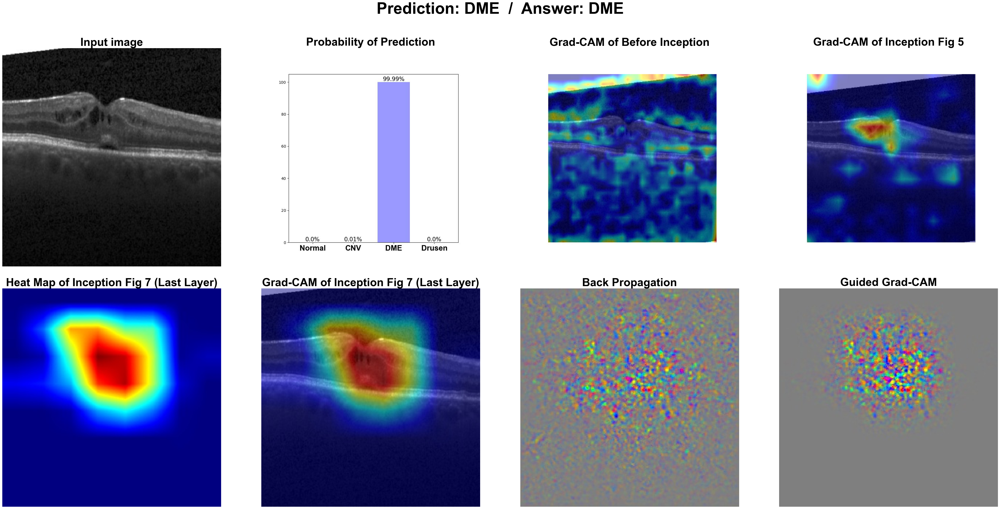

In [214]:
# Main
fig, subplot = plt.subplots(2,4,figsize=(50,25))
plt.subplots_adjust(left=0.05, right=0.95, bottom=0.1, top=0.9, wspace=0.01, hspace=0.1)
suptitle_fontdict={'fontname': 'Arial','fontsize': 50, 'fontweight': 'bold'}
fig.suptitle(f'Prediction: {idx2label[pred]}  /  Answer: {label}', **suptitle_fontdict)

# Input image
pil_img = Image.open(test_img_path)
pil_transform = transforms.Compose([
            transforms.Resize([350]),
            transforms.CenterCrop(299),
        ])

subtitle_fontdict={'fontname': 'Arial','fontsize': 35, 'fontweight': 'bold'}
subplot[0,0].imshow(pil_transform(pil_img), cmap='gray')
subplot[0,0].set_title('Input image', **subtitle_fontdict)
subplot[0,0].axis('off')

# Bar chart
bar_chart = Image.open(os.path.join(saved_loc, "Prediction_bar_chart.jpg"))
subplot[0,1].imshow(bar_chart)
subplot[0,1].set_title('Probability of Prediction', **subtitle_fontdict)
subplot[0,1].axis('off')


# Grad-CAM of early layer
G_result_1= cv2.cvtColor(cv2.imread(os.path.join(saved_loc, "After Inception Figure 5.jpg")), cv2.COLOR_BGR2RGB)
subplot[0,2].imshow(G_result_1)
subplot[0,2].set_title('Grad-CAM of Before Inception', **subtitle_fontdict)
subplot[0,2].axis('off')

G_result_2= cv2.cvtColor(cv2.imread(os.path.join(saved_loc, "After Inception Figure 6.jpg")), cv2.COLOR_BGR2RGB)
subplot[0,3].imshow(G_result_2)
subplot[0,3].set_title('Grad-CAM of Inception Fig 5', **subtitle_fontdict)
subplot[0,3].axis('off')

# Grad-CAM
G_heatmap = cv2.cvtColor(cv2.imread(os.path.join(saved_loc, "Grad_CAM_heatmap.jpg")), cv2.COLOR_BGR2RGB)
subplot[1,0].imshow(G_heatmap)
subplot[1,0].set_title('Heat Map of Inception Fig 7 (Last Layer)', **subtitle_fontdict)
subplot[1,0].axis('off')

G_result = cv2.cvtColor(cv2.imread(os.path.join(saved_loc, "Grad_Result.jpg")), cv2.COLOR_BGR2RGB)
subplot[1,1].imshow(G_result)
subplot[1,1].set_title('Grad-CAM of Inception Fig 7 (Last Layer)', **subtitle_fontdict)
subplot[1,1].axis('off')

# Guided-backprop
G_Back = cv2.cvtColor(cv2.imread(os.path.join(saved_loc, "Guided_Backprop.jpg")), cv2.COLOR_BGR2RGB)
subplot[1,2].imshow(G_Back)
subplot[1,2].set_title('Back Propagation', **subtitle_fontdict)
subplot[1,2].axis('off')

G_CAM = cv2.cvtColor(cv2.imread(os.path.join(saved_loc, "Guided_Grad_CAM.jpg")), cv2.COLOR_BGR2RGB)
subplot[1,3].imshow(G_CAM)
subplot[1,3].set_title('Guided Grad-CAM', **subtitle_fontdict)
subplot[1,3].axis('off')

plt.savefig(os.path.join(saved_loc, "Final_visualization.jpg"), format='jpeg')
plt.show()